# Autoencoders

### Table of contents<font><a class='anchor' id='top'></a>
- [Introduction](#intro)
- [Downloading the dataset](#download)
- [Preparing the dataset](#preparing)
- [Training the autoencoder](#autoencoder)
- [Training the variational autoencoder](#variationalautoencoder)
- [Semi-supervised learning](#ssl)
- [Treasure hunt](#treasurehunt)
- [Further exercises](#stretchgoals)

<a name="intro"></a>
# Introduction

In this training, we will use autoencoders, a type of artificial neural network, to analyse and extract meaningful information from satellite imagery covering the landscapes of the UK. Autoencoders are particularly useful for tasks like image denoising, feature extraction, and even generation of new images.

Usually in a conventional neural network, one tries to predict a target vector $\bf{y}$ from input vectors $\bf{x}$. In an auto-encoder network, one tries to predict $\bf{x}$ from $\bf{x}$. It is trivial to learn a mapping from $\bf{x}$ to $\bf{x}$ if the network has no constraints, but if the network is constrained the learning process becomes more interesting.

By limiting the amount of information that can flow through the network, autoencoders can learn the most important attributes of the input data and how to best reconstruct the original input from an “encoded” state. Ideally, this encoding will learn and describe latent attributes of the input data.

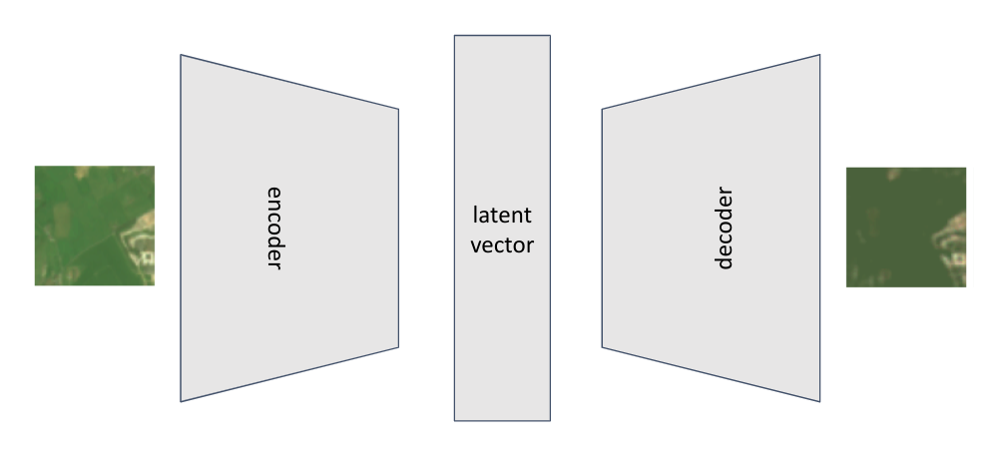

An autoencoder consists of some main components:

1. A section of the network compresses the input (the **encoder**)
2. Another section reverses the process (the **decoder**)

In the middle of these sections, there's a crucial component: a **bottleneck**.

The bottleneck forces the network to simplify the input data, compressing it down into a simpler, streamlined form known as a 'latent space'. Anything that's not essential, goes away.

In the end, the bottleneck gives us a compact representation of the dataset.
This is the main goal of the autoencoder - to create a good, compressed representation of the data.

In [1]:
import torch

# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [2]:
import torch

# Check if CUDA (GPU support) is available
if torch.cuda.is_available():
    # Get the number of available GPUs
    gpus = torch.cuda.device_count()
    
    # Set memory growth or other configurations for each GPU
    for gpu in range(gpus):
        torch.cuda.set_per_process_memory_fraction(1.0, device=gpu)  # Similar to memory growth in TensorFlow
else:
    print("No GPUs available.")

In [3]:
# Check if CUDA (GPU support) is available
if not torch.cuda.is_available():
    print("Can't find a GPU to use. Are you on the right kernel?\n(Go to Runtime > Change runtime type)")
elif torch.cuda.is_available():
    print("GPU ready to use. :)")

GPU ready to use. :)


<a name="download"></a>
# Download data
First, we download and unzip the dataset. This consists of red-green-blue Sentinel-2 images over the UK, with an associated .csv file that contains some metadata.

In [6]:
# the ! means we can use command line linux commands
!wget https://gws-access.jasmin.ac.uk/public/sensecdt/eesjb/sense_ae.zip
!unzip sense_ae.zip

--2025-03-18 10:29:52--  https://gws-access.jasmin.ac.uk/public/sensecdt/eesjb/sense_ae.zip
Resolving gws-access.jasmin.ac.uk (gws-access.jasmin.ac.uk)... 130.246.128.97
Connecting to gws-access.jasmin.ac.uk (gws-access.jasmin.ac.uk)|130.246.128.97|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 210219517 (200M) [application/zip]
Saving to: ‘sense_ae.zip’

sense_ae.zip        100%[===================>] 200.48M   145MB/s    in 1.4s    

2025-03-18 10:30:00 (145 MB/s) - ‘sense_ae.zip’ saved [210219517/210219517]

Archive:  sense_ae.zip
   creating: sense_ae_data/
  inflating: sense_ae_data/sense_ae_metadata.csv  
   creating: sense_ae_data/leeds/
  inflating: sense_ae_data/leeds/image_2020_leeds_6_5401_7575.tif  
  inflating: sense_ae_data/leeds/image_2020_leeds_6_8527_6325.tif  
  inflating: sense_ae_data/leeds/image_2020_leeds_6_7230_9067.tif  
  inflating: sense_ae_data/leeds/image_2020_leeds_6_7474_7618.tif  
  inflating: sense_ae_data/leeds/image_2020_leeds

In [4]:
import pandas as pd

df = pd.read_csv('sense_ae_data/sense_ae_metadata.csv')

print(df.head())
print('---')
print(df.value_counts('location'))

                                            filename  year location  month
0  sense_ae_data/leeds/image_2018_leeds_5_9622_16...  2018    leeds      5
1  sense_ae_data/leeds/image_2020_leeds_4_1698_10...  2020    leeds      4
2  sense_ae_data/leeds/image_2020_leeds_4_8503_77...  2020    leeds      4
3  sense_ae_data/leeds/image_2020_leeds_4_10448_6...  2020    leeds      4
4  sense_ae_data/leeds/image_2018_leeds_5_1_9246.tif  2018    leeds      5
---
location
leeds        4305
edinburgh    2648
Name: count, dtype: int64


<a name="preparing"></a>
# Preparing the data

In [5]:
# Library imports

# We use PyTorch for our neural networks
# import torch
import torch.nn as nn
import torch.nn.functional as F

# We use these libraries to find and load TIFF files
from glob import glob
import tifffile

# For maths and plotting
import numpy as np
import matplotlib.pyplot as plt

# For progress bars
from tqdm import tqdm

# For randomization
import random

In [6]:
#load a directory of tiff files for keras
def load_tiff_files(directory):
    files = glob(directory + '/*/*.tif')
    #we shuffle when we can to avoid any biases being introduced later on
    random.shuffle(files)
    images = []
    filepaths = []
    for file in tqdm(files):
      img = tifffile.imread(file)
      if not np.any(np.isnan(img)):
        images.append(img)
        filepaths.append(file)
    return np.array(images), np.array(filepaths)

# Load the data
data, filepaths = load_tiff_files('sense_ae_data')

print(f'Found {len(data)} files')

  2%|▏         | 113/6953 [00:00<00:06, 1128.64it/s]

100%|██████████| 6953/6953 [00:09<00:00, 766.87it/s]


Found 6953 files


In [7]:
data_mean, data_std = data.mean(axis=0).mean(axis=0).mean(axis=0), data.std(axis=0).std(axis=0).std(axis=0)
print('data_mean', data_mean, 'data_std', data_std)

#normalise the data so that the dataset has a mean of 0 and a standard deviation of 1.
#This will improve the model training (see what happens when you train a model without this step)
data = (data - data_mean) / data_std

data_mean [0.05510596 0.0637589  0.03778712] data_std [0.00029924 0.00031184 0.00031571]


In [8]:
def unnormalise(image, mean=data_mean, std_=data_std):
  #a useful function for when we want to return an image to its original pixel value range
  #(for plotting purposes)
  return (image*std_)+mean

In [101]:
def unnormalise(image, mean=data_mean, std_=data_std):
    """
    Unnormalises an image by reversing the normalisation process.

    Args:
        image (numpy.ndarray or torch.Tensor): The normalised image with shape (H, W, C).
        mean (numpy.ndarray or torch.Tensor): The mean used for normalisation, shape (C,).
        std_ (numpy.ndarray or torch.Tensor): The standard deviation used for normalisation, shape (C,).

    Returns:
        numpy.ndarray or torch.Tensor: The unnormalised image.
    """
    # Reshape mean and std_ to (1, 1, C) for broadcasting
    mean = mean.reshape(1, 1, -1)
    std_ = std_.reshape(1, 1, -1)

    # Reverse the normalisation
    return (image * std_) + mean

<a name="autoencoder"></a>
# Training the autoencoder

Since our inputs are images, we use convolutional neural networks as encoders and decoders. Autoencoders applied to images are very often convolutional autoencoders - they perform much better than simpler artificial neural networks.

**Encoder:**
* The "encoder" takes an input image (in this case, 64x64 pixels with 3 color channels for RGB) and tries to compress it into a smaller, simpler representation.
* It starts with the original image input.
* Then it passes the image through a series of convolutional layers (Conv2D), each followed by an activation function called ELU and a dropout layer (which helps prevent overfitting).
* These layers gradually reduce the size of the image (downsampling) while learning important features.
* The final output of the encoder is a "latent space" representation, which is a compact version of the input image but with fewer dimensions (in this case, 64 dimensions).

**Decoder:**
* The "decoder" takes this compact representation (the latent space) and tries to reconstruct the original image from it.
* It starts with the compact representation.
* Then it passes it through a series of layers that do the opposite of the encoder: upsampling the image.
* The layers gradually increase the size of the image (Conv2DTranspose layers), with each followed by an ELU activation and a dropout.
* The final output of the decoder is an image that should ideally look like the original input.

**Putting it Together:**
*The "autoencoder" is created by connecting the encoder's input to the decoder's output.
* This creates a full model that takes an image, compresses it into a smaller representation, then tries to reconstruct the original image.
* When training this autoencoder, it tries to minimize the difference between the input image and the reconstructed image. In this case, it's using the Mean Squared Error (MSE) as the measure of this difference.

**Summary:**
* So, in simple terms, this code creates a model that can compress images into a simpler form (encoder), then expand them back to their original form (decoder).
* This can be useful for tasks like reducing the size of images for storage, removing noise from images, or even generating new images.

The compile function at the end is just setting up the model for training, using the Adam optimizer and Mean Squared Error (MSE) as the loss function. This means when you train the model on a dataset, it will try to adjust its internal parameters (weights) to minimize the difference between the original and reconstructed images.

In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class Autoencoder(nn.Module):
    """
    A convolutional autoencoder model for encoding and decoding images.

    Args:
        input_shape (tuple): Shape of the input image (height, width, channels). Default is (64, 64, 3).
        dropout (float): Dropout rate for regularization. Default is 0.3.
        latent_dim (int): Dimensionality of the latent space. Default is 64.

    Attributes:
        encoder (nn.Sequential): The encoder network.
        decoder (nn.Sequential): The decoder network.
    """

    def __init__(self, input_shape=(64, 64, 3), dropout=0.3, latent_dim=64):
        super(Autoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(input_shape[2], 16, kernel_size=3, padding=1),  # (64, 64, 3) -> (64, 64, 16)
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),  # (64, 64, 16) -> (32, 32, 32)
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # (32, 32, 32) -> (16, 16, 64)
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # (16, 16, 64) -> (8, 8, 128)
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Flatten(),  # (8, 8, 128) -> (8*8*128)
            nn.Linear(8 * 8 * 128, latent_dim),  # Latent space
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 8 * 8 * 128),  # Latent space -> (8, 8, 128)
            nn.Unflatten(1, (128, 8, 8)),  # (8*8*128) -> (8, 8, 128)
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),  # (8, 8, 128) -> (16, 16, 64)
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),  # (16, 16, 64) -> (32, 32, 32)
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),  # (32, 32, 32) -> (64, 64, 16)
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(16, input_shape[2], kernel_size=3, padding=1),  # (64, 64, 16) -> (64, 64, 3)
        )

    def forward(self, x):
        """
        Forward pass of the autoencoder.

        Args:
            x (torch.Tensor): Input tensor of shape (batch_size, channels, height, width).

        Returns:
            torch.Tensor: Reconstructed output tensor of the same shape as the input.
        """
        latent = self.encoder(x)
        decoded = self.decoder(latent)
        return decoded


# Instantiate the model
autoencoder = Autoencoder(input_shape=(64, 64, 3), dropout=0.3, latent_dim=256)

# Define the encoder and decoder as separate models
ae_encoder = autoencoder.encoder
ae_decoder = autoencoder.decoder

# Define the optimizer and loss function
optimizer = torch.optim.Adam(autoencoder.parameters())
loss_fn = nn.MSELoss()

# Print the model architecture
print(autoencoder)

Autoencoder(
  (encoder): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Dropout(p=0.3, inplace=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): ELU(alpha=1.0)
    (5): Dropout(p=0.3, inplace=False)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): ELU(alpha=1.0)
    (8): Dropout(p=0.3, inplace=False)
    (9): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): ELU(alpha=1.0)
    (11): Dropout(p=0.3, inplace=False)
    (12): Flatten(start_dim=1, end_dim=-1)
    (13): Linear(in_features=8192, out_features=256, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=256, out_features=8192, bias=True)
    (1): Unflatten(dim=1, unflattened_size=(128, 8, 8))
    (2): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ELU(alpha=1.0)
    (4): Dropout(p=0.

In [11]:
print(0.8*len(data))
train_data = data[:5500]
val_data = data[5500:]

#x (features) and y (labels) are the same for an autoencoder.
#It is trained so that the mean squared error (mse) of the training data is minimised.
history = autoencoder.fit(x=train_data, y=train_data, validation_data=(val_data, val_data), epochs=25, batch_size=32)

5562.400000000001


In [17]:
import torch
from torch.utils.data import DataLoader, TensorDataset

# Assuming `data` is a NumPy array or PyTorch tensor
print(0.8 * len(data))

# Split the data into training and validation sets
train_data = data[:5500]
val_data = data[5500:]

# Convert data to PyTorch tensors
train_data = torch.tensor(train_data, dtype=torch.float32)
val_data = torch.tensor(val_data, dtype=torch.float32)

# Permute the dimensions to match PyTorch's format: (batch_size, channels, height, width)
train_data = train_data.permute(0, 3, 1, 2)  # From (batch_size, height, width, channels) to (batch_size, channels, height, width)
val_data = val_data.permute(0, 3, 1, 2)

# train_data = train_data.to(device)  # Move data to GPU
# val_data = val_data.to(device)

# Create DataLoader for training and validation
batch_size = 32
train_dataset = TensorDataset(train_data, train_data)  # x and y are the same for autoencoder
val_dataset = TensorDataset(val_data, val_data)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Define the optimizer and loss function
optimizer = torch.optim.Adam(autoencoder.parameters())
loss_fn = nn.MSELoss()

# Training loop
epochs = 25
history = {'train_loss': [], 'val_loss': []}  # To store loss values

for epoch in range(epochs):
    autoencoder.train()  # Set model to training mode
    train_loss = 0.0

    # Training phase
    for batch in train_loader:
        x, y = batch  # x and y are the same for autoencoder
        optimizer.zero_grad()  # Clear gradients
        outputs = autoencoder(x)  # Forward pass
        loss = loss_fn(outputs, y)  # Compute loss
        loss.backward()  # Backward pass
        optimizer.step()  # Update weights
        train_loss += loss.item() * x.size(0)  # Accumulate loss

    # Calculate average training loss for the epoch
    train_loss /= len(train_loader.dataset)
    history['train_loss'].append(train_loss)

    # Validation phase
    autoencoder.eval()  # Set model to evaluation mode
    val_loss = 0.0

    with torch.no_grad():  # Disable gradient computation
        for batch in val_loader:
            x, y = batch
            outputs = autoencoder(x)
            loss = loss_fn(outputs, y)
            val_loss += loss.item() * x.size(0)

    # Calculate average validation loss for the epoch
    val_loss /= len(val_loader.dataset)
    history['val_loss'].append(val_loss)

    # Print progress
    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

# `history` now contains the training and validation loss for each epoch

5562.400000000001


Epoch 1/25, Train Loss: 5121.2574, Val Loss: 3796.7811
Epoch 2/25, Train Loss: 3459.8605, Val Loss: 3257.5244
Epoch 3/25, Train Loss: 3097.1694, Val Loss: 3254.2362
Epoch 4/25, Train Loss: 2884.1536, Val Loss: 3021.7556
Epoch 5/25, Train Loss: 2772.1141, Val Loss: 2990.4764
Epoch 6/25, Train Loss: 2690.1976, Val Loss: 2570.8325
Epoch 7/25, Train Loss: 2479.0168, Val Loss: 2673.3227
Epoch 8/25, Train Loss: 2385.8806, Val Loss: 2432.3891
Epoch 9/25, Train Loss: 2383.9542, Val Loss: 2606.3565
Epoch 10/25, Train Loss: 2254.7624, Val Loss: 2645.0025
Epoch 11/25, Train Loss: 2144.6723, Val Loss: 2276.6262
Epoch 12/25, Train Loss: 2118.7628, Val Loss: 2330.0598
Epoch 13/25, Train Loss: 2159.9579, Val Loss: 2211.1209
Epoch 14/25, Train Loss: 2119.0711, Val Loss: 2525.5415
Epoch 15/25, Train Loss: 2036.3004, Val Loss: 2350.5271
Epoch 16/25, Train Loss: 1992.7909, Val Loss: 2298.0104
Epoch 17/25, Train Loss: 1951.8699, Val Loss: 2426.1814
Epoch 18/25, Train Loss: 2050.9888, Val Loss: 2410.0354
E

In [ ]:
from tqdm import tqdm
from torch import GradScaler, autocast

# Enable CuDNN benchmark
torch.backends.cudnn.benchmark = True

# Move model and data to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
autoencoder.to(device)
train_data = train_data.to(device)
val_data = val_data.to(device)

# Mixed precision training
scaler = GradScaler()

# Training loop
epochs = 25
history = {'train_loss': [], 'val_loss': []}

for epoch in range(epochs):
    autoencoder.train()
    train_loss = 0.0

    # Training phase with tqdm
    train_loader_tqdm = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} [Training]", leave=False)
    for batch in train_loader_tqdm:
        x, y = batch
        x, y = x.to(device), y.to(device)

        optimizer.zero_grad()

        with autocast():  # Mixed precision
            outputs = autoencoder(x)
            loss = loss_fn(outputs, y)

        scaler.scale(loss).backward()  # Scale loss for mixed precision
        scaler.step(optimizer)
        scaler.update()

        train_loss += loss.item() * x.size(0)
        train_loader_tqdm.set_postfix({"Training Loss": loss.item()})

    # Calculate average training loss
    train_loss /= len(train_loader.dataset)
    history['train_loss'].append(train_loss)

    # Validation phase
    autoencoder.eval()
    val_loss = 0.0

    val_loader_tqdm = tqdm(val_loader, desc=f"Epoch {epoch + 1}/{epochs} [Validation]", leave=False)
    with torch.no_grad():
        for batch in val_loader_tqdm:
            x, y = batch
            x, y = x.to(device), y.to(device)

            outputs = autoencoder(x)
            loss = loss_fn(outputs, y)
            val_loss += loss.item() * x.size(0)

            val_loader_tqdm.set_postfix({"Validation Loss": loss.item()})

    # Calculate average validation loss
    val_loss /= len(val_loader.dataset)
    history['val_loss'].append(val_loss)

    # Print epoch summary
    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

In [ ]:
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.nn as nn
import torch.optim as optim
from torch import autocast, GradScaler

# Assuming `data` is a NumPy array or PyTorch tensor
print(0.8 * len(data))

# Split the data into training and validation sets
train_data = data[:5500]
val_data = data[5500:]

# Convert data to PyTorch tensors
train_data = torch.tensor(train_data, dtype=torch.float32)
val_data = torch.tensor(val_data, dtype=torch.float32)

# Permute the dimensions to match PyTorch's format: (batch_size, channels, height, width)
train_data = train_data.permute(0, 3, 1, 2)  # From (batch_size, height, width, channels) to (batch_size, channels, height, width)
val_data = val_data.permute(0, 3, 1, 2)

# Move data to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
train_data = train_data.to(device)
val_data = val_data.to(device)

# Create DataLoader for training and validation
batch_size = 32
train_dataset = TensorDataset(train_data, train_data)  # x and y are the same for autoencoder
val_dataset = TensorDataset(val_data, val_data)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

# Define the optimizer and loss function
autoencoder = autoencoder.to(device)
optimizer = optim.Adam(autoencoder.parameters())
loss_fn = nn.MSELoss()

# Mixed precision training setup
scaler = GradScaler("cuda")

# Training loop
epochs = 25
history = {'train_loss': [], 'val_loss': []}  # To store loss values

for epoch in range(epochs):
    autoencoder.train()  # Set model to training mode
    train_loss = 0.0

    # Training phase
    for batch in train_loader:
        x, y = batch  # x and y are the same for autoencoder
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()  # Clear gradients

        with autocast("cuda"):
            outputs = autoencoder(x)  # Forward pass
            loss = loss_fn(outputs, y)  # Compute loss

        scaler.scale(loss).backward()  # Backward pass
        scaler.step(optimizer)  # Update weights
        scaler.update()

        train_loss += loss.item() * x.size(0)  # Accumulate loss

    # Calculate average training loss for the epoch
    train_loss /= len(train_loader.dataset)
    history['train_loss'].append(train_loss)

    # Validation phase
    autoencoder.eval()  # Set model to evaluation mode
    val_loss = 0.0

    with torch.no_grad():  # Disable gradient computation
        for batch in val_loader:
            x, y = batch
            x, y = x.to(device), y.to(device)
            outputs = autoencoder(x)
            loss = loss_fn(outputs, y)
            val_loss += loss.item() * x.size(0)

    # Calculate average validation loss for the epoch
    val_loss /= len(val_loader.dataset)
    history['val_loss'].append(val_loss)

    # Print progress
    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

# `history` now contains the training and validation loss for each epoch

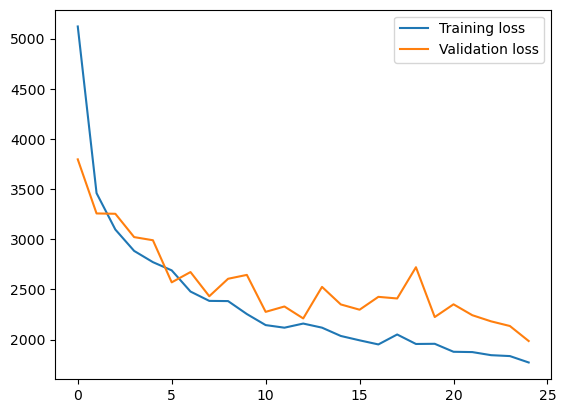

In [20]:
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

In [25]:
val_data[0].cpu().numpy().shape

(3, 64, 64)

In [32]:
def unnormalise(image, mean=data_mean, std_=data_std):
    """
    Unnormalises an image by reversing the normalisation process.

    Args:
        image (numpy.ndarray or torch.Tensor): The normalised image with shape (H, W, C).
        mean (numpy.ndarray or torch.Tensor): The mean used for normalisation, shape (C,).
        std_ (numpy.ndarray or torch.Tensor): The standard deviation used for normalisation, shape (C,).

    Returns:
        numpy.ndarray or torch.Tensor: The unnormalised image.
    """
    # Reshape mean and std_ to (1, 1, C) for broadcasting
    mean = mean.reshape(1, 1, -1)
    std_ = std_.reshape(1, 1, -1)

    # Reverse the normalisation
    return (image * std_) + mean

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07249999018515273..2.4240000832094815].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.12892187812292982..1.0867794617983368].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.19549999972972681..1.1599999718028595].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07449999766531529..0.5609999961475319].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08249999879319009..2.24600000442237].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.12460758208436148..1.0961927308988095].


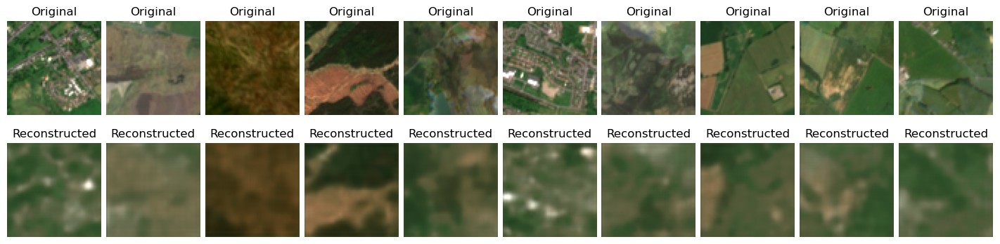

In [34]:
import matplotlib.pyplot as plt
import numpy as np
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
autoencoder = autoencoder.to(device)  # Ensure the model is on the correct device

brightness = 5

# Build two rows of 10 images: top row is original, bottom row is reconstructed
plt.figure(figsize=(20, 4))
for i in range(10):
    # Plot original image
    plt.subplot(2, 10, i + 1)
    original_img = val_data[i].cpu().numpy()  # Transfer to CPU and convert to NumPy for plotting
    original_img = np.transpose(original_img, (1, 2, 0))  # Change from (C, H, W) to (H, W, C)
    plt.imshow(unnormalise(original_img) * brightness)
    plt.axis('off')
    plt.title('Original')

    # Plot reconstructed image
    plt.subplot(2, 10, i + 11)
    with torch.no_grad():  # Disable gradient computation for inference
        # Add extra dimension as the model expects a batch dimension and ensure tensor is on the device
        predicted_img = autoencoder(val_data[i].unsqueeze(0).to(device))
    # Move to CPU, detach, convert to NumPy, and squeeze away the batch dimension
    predicted_img = predicted_img.cpu().detach().numpy().squeeze()
    predicted_img = np.transpose(predicted_img, (1, 2, 0))  # Change from (C, H, W) to (H, W, C)
    plt.imshow(unnormalise(predicted_img) * brightness)
    plt.title('Reconstructed')
    plt.axis('off')

# Reduce spacing between images
plt.subplots_adjust(wspace=-0.5, hspace=0.3)
plt.show()


In [36]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
import torch

pca = PCA(n_components=2)

def plot_latent_space_2d(encoder, data, filepaths, brightness=1.5, labels=10):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    encoder = encoder.to(device)
    encoder.eval()  # Set the model to evaluation mode

    colours = ['red' if 'leeds' in filepath else 'blue' for filepath in filepaths]

    # Convert input data to PyTorch tensor and move to device
    data_tensor = torch.tensor(data, dtype=torch.float).to(device)

    # Predict the latent space representations with the encoder
    with torch.no_grad():
        x_encoded = encoder(data_tensor).cpu().numpy()  # Predict and move data back to CPU/numpy

    # Flatten the outputs if necessary (depends on the output shape of the encoder)
    x_encoded = x_encoded.reshape(x_encoded.shape[0], -1)

    # Reduce to 2D using PCA
    x_encoded = pca.fit_transform(x_encoded)

    # Plot the embeddings (that are in 2D) on a scatter plot
    plt.scatter(x_encoded[:, 0], x_encoded[:, 1], c=colours, s=3, alpha=0.25)

    # Plot the idx of images furthest from the origin
    dist = np.sqrt(np.sum(x_encoded**2, axis=1))
    furthest = np.argsort(dist)[::-1][:labels]
    for i in furthest:
        plt.text(x_encoded[i, 0], x_encoded[i, 1], str(i), fontsize=10, alpha=0.75)
    plt.show()

    # Show the images furthest from the origin in a row
    print('Top images furthest from origin:')
    fig, ax = plt.subplots(1, labels, figsize=(20, 2))
    for i in range(labels):
        img = unnormalise(data[furthest[i]]) * brightness
        ax[i].imshow(img)
        ax[i].axis('off')
    plt.show()

    return furthest


In [51]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
import torch

pca = PCA(n_components=2)

def plot_latent_space_2d(encoder, data, filepaths, brightness=1.5, labels=10):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    encoder = encoder.to(device)
    encoder.eval()  # Set the model to evaluation mode

    colours = ['red' if 'leeds' in filepath else 'blue' for filepath in filepaths]

    # Convert input data to PyTorch tensor, permute it to match (N, C, H, W), and move to device
    data_tensor = torch.tensor(data, dtype=torch.float).permute(0, 3, 1, 2).to(device)

    # Predict the latent space representations with the encoder
    with torch.no_grad():
        x_encoded = encoder(data_tensor).cpu().numpy()  # Predict and move data back to CPU/numpy

    # Flatten the outputs if necessary (depends on the output shape of the encoder)
    x_encoded = x_encoded.reshape(x_encoded.shape[0], -1)

    # Reduce to 2D using PCA
    x_encoded = pca.fit_transform(x_encoded)

    # Plot the embeddings (that are in 2D) on a scatter plot
    plt.scatter(x_encoded[:, 0], x_encoded[:, 1], c=colours, s=3, alpha=0.25)

    # Plot the idx of images furthest from the origin
    dist = np.sqrt(np.sum(x_encoded**2, axis=1))
    furthest = np.argsort(dist)[::-1][:labels]
    for i in furthest:
        plt.text(x_encoded[i, 0], x_encoded[i, 1], str(i), fontsize=10, alpha=0.75)
    plt.show()

    # Show the images furthest from the origin in a row
    print('Top images furthest from origin:')
    fig, ax = plt.subplots(1, labels, figsize=(20, 2))
    for i in range(labels):
        img = unnormalise(data[furthest[i]]) * brightness
        ax[i].imshow(img)
        ax[i].axis('off')
    plt.show()

    return furthest


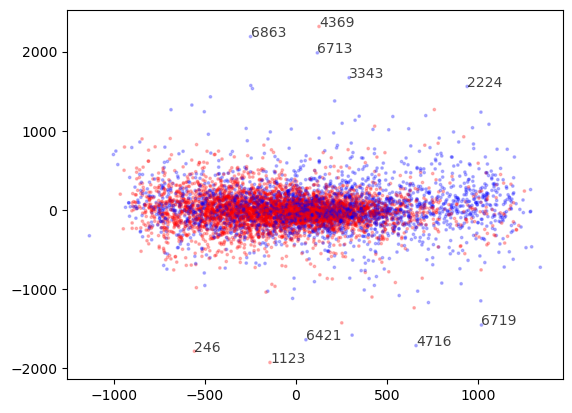

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10530000000000002..1.11].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11055000000000001..0.7074].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04897500000000002..0.7014].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09300000000000001..0.5184].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07485000000000001..2.5164].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13785000000000003..0.37260000000000004].
Clipping input data to the valid range for imshow with RGB data ([0..1] for f

Top images furthest from origin:


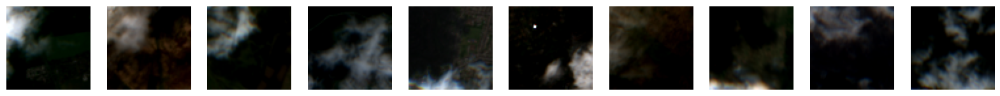

array([4369, 6863, 6713, 1123,  246, 4716, 2224, 6719, 3343, 6421])

In [39]:
plot_latent_space_2d(ae_encoder, data, filepaths)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1815849231261767..1.2084719799324073].


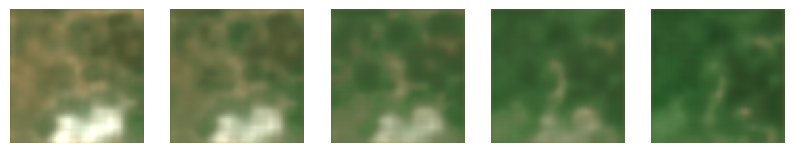

In [48]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# Setup
brightness = 6.5
n = 5  # number of steps in interpolation

# Assuming ae_encoder and ae_decoder are already defined and moved to the right device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ae_encoder = ae_encoder.to(device)
ae_decoder = ae_decoder.to(device)

# Ensure the model is in evaluation mode
ae_encoder.eval()
ae_decoder.eval()

# Data handling: assuming 'data' is a numpy array and needs proper conversion and device handling
data_tensor = torch.from_numpy(data).float().permute(0, 3, 1, 2).to(device)  # Adjusting from NHWC to NCHW

with torch.no_grad():
    x_encoded = ae_encoder(data_tensor).cpu().numpy()  # Encode the data

# Randomly choose start and end indices
start_idx = np.random.randint(0, len(data))
end_idx = np.random.randint(0, len(data))

# Plotting setup
plt.figure(figsize=(10, 5))

for i in range(n):
    # Interpolate between the encodings
    alpha = i / (n - 1)
    z_sample = x_encoded[start_idx] * (1 - alpha) + x_encoded[end_idx] * alpha

    # Decode the interpolated sample
    z_tensor = torch.from_numpy(z_sample).float().to(device).unsqueeze(0)  # Adjust dimensions and type
    with torch.no_grad():
        x_decoded = ae_decoder(z_tensor).cpu().numpy()

    # Prepare the image for display
    patch = x_decoded[0].transpose(1, 2, 0)  # Assuming output is CxHxW, converting to HxWxC

    # Displaying the interpolated images
    plt.subplot(1, n, i + 1)
    plt.imshow(unnormalise(patch) * brightness)
    plt.axis('off')

plt.show()


Anomaly detection is one application of autoencoders.

In this dataset, most of the clouds have been removed on purpose. The vast majority of images are therefore cloud-free... But there are some images that have been left in.

Here is how an autoencoder help us automatically find these kinds of images:

We train the autoencoder with the entire dataset. Since most satellite images look cloud-free, the model will learn to discard any uncommon characteristics.

The compressed representation will contain common features representative of most images in the data.

What happens if we try autoencoding a cloudy image?

The result of the decoder will be very different from the original picture.

Our model can't reproduce this image as easily from the compressed representation, so we know this is an anomaly!

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5473..2.5506].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.129025..10.8576].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5187..2.4284000000000003].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19174999999999998..4.331600000000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5414499999999999..6.580600000000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13487500000000002..6.351800000000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floa

[ 711.70941389 1193.20850723 2868.24557985 ... 5294.77212823 1204.91680558
 9160.20714555]


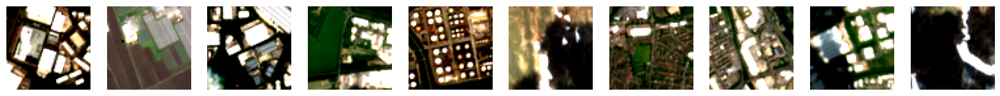

In [52]:
import torch
import numpy as np
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
autoencoder = autoencoder.to(device)
autoencoder.eval()

# Assuming 'data' is already loaded as a numpy array
data_tensor = torch.from_numpy(data).float().permute(0, 3, 1, 2).to(device)  # NHWC to NCHW

# Get predictions from the autoencoder
with torch.no_grad():
    preds_tensor = autoencoder(data_tensor).cpu()  # Run model and move output to CPU

# Convert predictions back to NHWC for error calculation
preds = preds_tensor.permute(0, 2, 3, 1).numpy()

# Calculate squared reconstruction error
recon_err = np.mean(np.square(data - preds), axis=(1, 2, 3))

# Determine the top N anomalies
N = 10
anomalies = np.argsort(recon_err)[::-1][:N]

# Print reconstruction errors
print(recon_err)

# Visualization
brightness = 6.5
fig, ax = plt.subplots(1, N, figsize=(N * 2, 2))  # Adjusted subplot dimensions for clarity
for i in range(N):
    anomaly_image = data[anomalies[i]]
    if anomaly_image.shape[2] == 1:  # If grayscale, repeat dimensions to avoid matplotlib error
        anomaly_image = anomaly_image.repeat(3, axis=2)
    ax[i].imshow(unnormalise(anomaly_image) * brightness)
    ax[i].axis('off')
plt.show()


218/218 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step


[5135.99007721 1113.65308266 1603.63958333 ... 1593.71768148 2597.81203751
 2037.48341618]


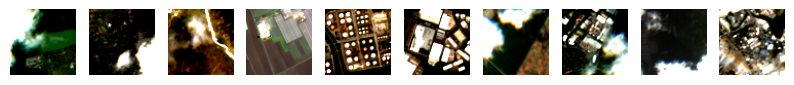

In [ ]:
preds = autoencoder.predict(data).squeeze()
recon_err =  np.mean( np.square(data-preds), axis=(1,2,3))

N = 10
anomalies = np.argsort(recon_err)[::-1][:N]
print(recon_err)

fig, ax = plt.subplots(1, N, figsize=(N, 5))
for i in range(N):
    ax[i].imshow( unnormalise(data[anomalies[i]])*brightness )
    ax[i].axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


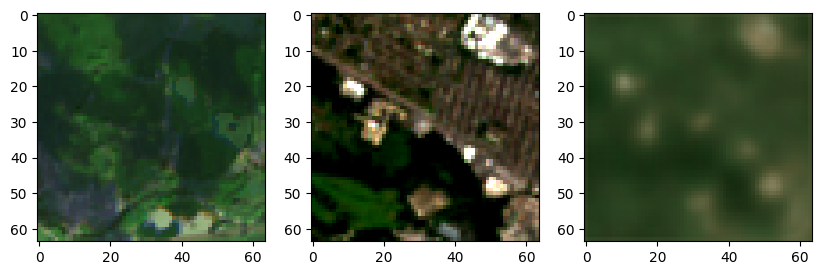

In [ ]:
brightness = 5.5

plt.figure(figsize=(10,5))
plt.subplot(131)
plt.imshow(unnormalise(data[start_idx])*brightness)
plt.subplot(132)
plt.imshow(unnormalise(data[end_idx])*brightness)

#combine the two images using autoencoder
#get encoding of both images
enc_a = ae_encoder.predict( np.expand_dims(data[start_idx],0) )
enc_b = ae_encoder.predict( np.expand_dims(data[end_idx],0) )
#combine the encodings
enc_combined = (enc_a+enc_b)/2
#decode the combined encoding
dec_combined = ae_decoder.predict(enc_combined)
#show the combined image
plt.subplot(133)
plt.imshow( unnormalise(dec_combined.squeeze())*brightness)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.13640000000000002..1.3826999999999998].


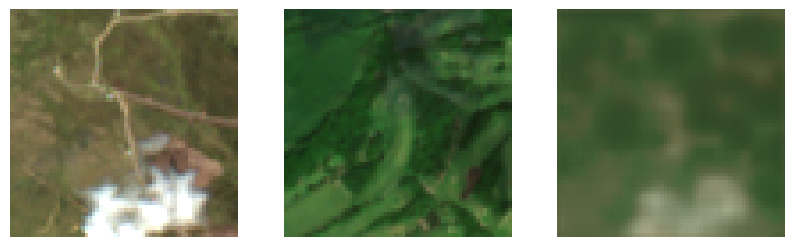

In [53]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# Setup device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ae_encoder = ae_encoder.to(device)
ae_decoder = ae_decoder.to(device)

brightness = 5.5

# Assuming 'data' is a numpy array and already loaded
data_tensor = torch.from_numpy(data).float().permute(0, 3, 1, 2).to(device)  # NHWC to NCHW conversion for PyTorch

# Preparing plots
plt.figure(figsize=(10,5))

# Original Image at 'start_idx'
plt.subplot(131)
plt.imshow(unnormalise(data[start_idx])*brightness)
plt.axis('off')  # Hide axes for clarity

# Original Image at 'end_idx'
plt.subplot(132)
plt.imshow(unnormalise(data[end_idx])*brightness)
plt.axis('off')

# Combine the two images using autoencoder
with torch.no_grad():
    # Get encoding of both images
    enc_a = ae_encoder(data_tensor[start_idx].unsqueeze(0))  # Add batch dimension
    enc_b = ae_encoder(data_tensor[end_idx].unsqueeze(0))

    # Combine the encodings
    enc_combined = (enc_a + enc_b) / 2

    # Decode the combined encoding
    dec_combined = ae_decoder(enc_combined)
    dec_combined_np = dec_combined.cpu().permute(0, 2, 3, 1).numpy()  # Convert to NHWC for display and numpy

# Show the combined image
plt.subplot(133)
plt.imshow(unnormalise(dec_combined_np.squeeze()) * brightness)
plt.axis('off')

plt.show()


<a name="variationalautoencoder"></a>
# Variational Autoencoder

Variational Autoencoders were introduced by [Kingma and Welling (2013)](https://arxiv.org/abs/1312.6114).

A variational autoencoder is a type of autoencoder with added constraints on the encoded representations being learned. Instead of letting your neural network learn an arbitrary function like with the simple autoencoder, you are learning the parameters of a probability distribution modelling your data. If you sample points from this distribution, you can generate new input data samples: a VAE is a "generative model".

We aim to construct a generative model rather than a basic data structure that merely "memorises" images. At present, we cannot produce any output since we lack the knowledge to generate latent vectors apart from encoding them from images.

By imposing a constraint on the encoder network, we ensure it generates latent vectors that approximately adhere to a unit Gaussian distribution. This constraint is what distinguishes a variational autoencoder from a conventional one.

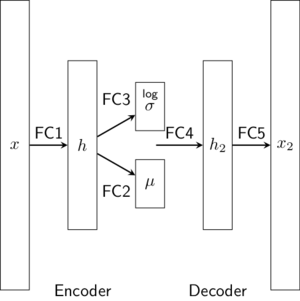

**Encoder:**
- The "encoder" part of the VAE compresses an input image into a lower-dimensional latent space.
- It starts with the original image input.
- Then, similar to the previous autoencoder, it passes the image through a series of convolutional layers, followed by ELU activation and dropout layers.
- However, instead of directly outputting the latent representation, it outputs the mean and variance parameters of a Gaussian distribution that represents the latent space.

**Variational Trick:**
- The "Lambda" layer functions to implement a customized lambda function. In this instance, it is utilized to convert the mean and variance into a representation within a latent space.
- This method enables the model to draw samples from this distribution during training, aiding the Variational Autoencoder (VAE) in acquiring knowledge of a smooth and continuous latent space.
- For a Gaussian distribution, we consider our noise as a standard normal distribution, meaning a Gaussian with a mean of 0 and a variance of 1. This noise element is now separate from and not influenced by our model's parameters.
- A beneficial characteristic of the Gaussian distribution is that to adjust the mean and variance of a sample, we can directly add the mean and then multiply by the variance. This process effectively scales a sample from our noise distribution. The advantage here is that the prediction of mean and variance is no longer dependent on the stochastic sampling operation (the process of generating random samples from the probability distribution).

**Generator (Decoder):**
- The "generator" part of the VAE takes a latent space representation and tries to reconstruct the original image.
- It starts with the latent space representation.
- Then, it goes through a series of layers that gradually upsample the image to the original size.
- Like before, these layers include convolutional transpose layers (Conv2DTranspose), ELU activation, and dropout.

**Noise Layer:**
- This VAE also includes a "noise" layer, which is used during training to make the encoder "variational."
- The noise layer adds randomness to the latent space, which can help improve the model's ability to generate diverse outputs.
- During training, a random noise vector is added to the mean and variance before sampling from the latent space.

**Model Assembly:**
- The "var_encoder" is the model for the encoder part of the VAE.
- The "var_generator" is the model for the generator part of the VAE.
- The "var_autoencoder" combines the encoder, noise layer, and generator to create the full VAE model.
- The "var_autoencoder" is what you train to learn the compressed latent space and the reconstruction process.

**Summary:**
- So, in simple terms, this code creates a Variational Autoencoder, which is an advanced type of autoencoder.
- It uses a more complex encoder that outputs the mean and variance of a Gaussian distribution.
- The decoder then takes samples from this distribution to reconstruct the image.
- The noise layer adds randomness during training to improve the model's ability to generate diverse outputs.
- The model is then compiled for training using the Adam optimizer and Mean Squared Error loss.

**Key Differences from a Simple Autoencoder:**
- The key difference from a simple autoencoder is the variational aspect, which allows for smoother and more structured latent spaces.
- This can be useful for tasks like generating new images, interpolating between images, or exploring the latent space of a dataset.

**How to Use:**
- To use this VAE, you would train it on a dataset of images.
- During training, it tries to reconstruct the original images while also learning a structured and continuous latent space.
- After training, you can generate new images by sampling from the learned latent space.

This kind of VAE architecture is particularly useful for generating new images that retain characteristics of the original dataset while being completely new and unique.


In [9]:
class VariationalAutoencoder(nn.Module):
    def __init__(self, input_shape=(64, 64, 3), dropout=0.3, latent_dim=64):
        super(VariationalAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(input_shape[2], 16, kernel_size=3, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.Flatten(),
        )

        # Latent space
        self.fc_mu = nn.Linear(8 * 8 * 128, latent_dim)
        self.fc_var = nn.Linear(8 * 8 * 128, latent_dim)

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 8 * 8 * 128),
            nn.Unflatten(1, (128, 8, 8)),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ELU(),
            nn.Dropout(dropout),
            nn.ConvTranspose2d(16, input_shape[2], kernel_size=3, padding=1),
        )

    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        encoded = self.encoder(x)
        mu = self.fc_mu(encoded)
        log_var = self.fc_var(encoded)
        # Clamping the log variance
        log_var = torch.clamp(log_var, min=-10, max=10)
        z = self.reparameterize(mu, log_var)
        decoded = self.decoder(z)
        return decoded, mu, log_var

def vae_loss(recon_x, x, mu, log_var):
    # Reconstruction loss
    BCE = F.mse_loss(recon_x, x, reduction='sum')
    # KL divergence
    KLD = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
    return BCE + KLD

# Create the VAE
vae = VariationalAutoencoder(input_shape=(64, 64, 3), dropout=0.3, latent_dim=256)
optimizer = torch.optim.Adam(vae.parameters(), lr=0.0005)

# Example forward pass (add a DataLoader in practice)
# loss = vae_loss(*vae(batch_images), batch_images)
# optimizer.zero_grad()
# loss.backward()
# optimizer.step()


In [11]:
print(0.8*len(data))
train_data = data[:5500]
val_data = data[5500:]


5562.400000000001


In [13]:
train_dataset.shape

NameError: name 'train_dataset' is not defined

In [38]:
val_data.shape

(1453, 64, 64, 3)

In [20]:
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.optim as optim
from tqdm import tqdm

# Setup device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# DataLoader setup
batch_size = 32
train_tensor = torch.tensor(train_data, dtype=torch.float32).permute(0, 3, 1, 2)#.to(device)
val_tensor = torch.tensor(val_data, dtype=torch.float32).permute(0, 3, 1, 2)#.to(device)
train_dataset = TensorDataset(train_tensor, train_tensor)  # Assuming train_data is prepared and on the correct device
val_dataset = TensorDataset(val_tensor, val_tensor)  # Assuming val_data is prepared and on the correct device
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

# VAE model, optimizer setup
vae = VariationalAutoencoder(input_shape=(64, 64, 3), dropout=0.3, latent_dim=256).to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# Define VAE specific loss function
def vae_loss(recon_x, x, mu, log_var):
    # Reconstruction loss
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')
    # KL divergence
    kl_div = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
    return recon_loss + kl_div

# Training loop
epochs = 25
history = {'train_loss': [], 'val_loss': []}

for epoch in range(epochs):
    vae.train()
    train_loss = 0.0
    with tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} - Train", unit="batch") as train_bar:
        for x, y in train_bar:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            
            # Forward pass
            recon_x, mu, log_var = vae(x)
            loss = vae_loss(recon_x, y, mu, log_var)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item() * x.size(0)
            train_bar.set_postfix(loss=train_loss / ((train_bar.n + 1) * batch_size))

    # Calculate average training loss
    train_loss /= len(train_loader.dataset)
    history['train_loss'].append(train_loss)

    # Validation phase
    val_loss = 0.0
    vae.eval()
    with tqdm(val_loader, desc="Validating", unit="batch", leave=False) as val_bar:
        for x, y in val_bar:
            x, y = x.to(device), y.to(device)
            with torch.no_grad():
                recon_x, mu, log_var = vae(x)
                loss = vae_loss(recon_x, y, mu, log_var)

            val_loss += loss.item() * x.size(0)

    # Calculate average validation loss
    val_loss /= len(val_loader.dataset)
    history['val_loss'].append(val_loss)

    # Print progress
    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

# Now `history` contains the training and validation loss for each epoch


Epoch 1/25 - Train:   0%|          | 0/172 [00:00<?, ?batch/s, loss=4.89e+10]

Epoch 1/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 179.43batch/s, loss=2.08e+9]


Epoch 1/25, Train Loss: 2023857217.4429, Val Loss: 1485144734.8548


Epoch 2/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 187.74batch/s, loss=1.55e+9]


Epoch 2/25, Train Loss: 1386934417.4545, Val Loss: 1402130792.6772


Epoch 3/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 185.36batch/s, loss=1.24e+9]


Epoch 3/25, Train Loss: 1236479025.0589, Val Loss: 1244643092.7681


Epoch 4/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 181.76batch/s, loss=1.18e+9]


Epoch 4/25, Train Loss: 1175290585.8327, Val Loss: 1293409371.3531


Epoch 5/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 190.04batch/s, loss=1.21e+9]


Epoch 5/25, Train Loss: 1123159409.7571, Val Loss: 1139805309.5554


Epoch 6/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 173.42batch/s, loss=1.13e+9]


Epoch 6/25, Train Loss: 1072410219.7062, Val Loss: 1058292727.0805


Epoch 7/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 172.66batch/s, loss=1.08e+9]


Epoch 7/25, Train Loss: 1013629189.9113, Val Loss: 993276514.3125


Epoch 8/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 184.01batch/s, loss=9.63e+8]


Epoch 8/25, Train Loss: 958300416.4189, Val Loss: 1008967646.8988


Epoch 9/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 186.82batch/s, loss=9.31e+8]


Epoch 9/25, Train Loss: 931885799.4240, Val Loss: 974765622.4418


Epoch 10/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 187.54batch/s, loss=9.36e+8]


Epoch 10/25, Train Loss: 937078202.2749, Val Loss: 949435465.0296


Epoch 11/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 176.60batch/s, loss=9.24e+8]


Epoch 11/25, Train Loss: 903651526.8887, Val Loss: 902481073.3985


Epoch 12/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 177.42batch/s, loss=8.95e+8]


Epoch 12/25, Train Loss: 859039007.4182, Val Loss: 893068041.8004


Epoch 13/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 181.89batch/s, loss=8.4e+8] 


Epoch 13/25, Train Loss: 840586700.5673, Val Loss: 908792702.7006


Epoch 14/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 180.62batch/s, loss=8.55e+8]


Epoch 14/25, Train Loss: 831076606.9527, Val Loss: 885099115.3861


Epoch 15/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 182.86batch/s, loss=8.15e+8]


Epoch 15/25, Train Loss: 815803922.0596, Val Loss: 887674797.8527


Epoch 16/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 184.00batch/s, loss=8.77e+8]


Epoch 16/25, Train Loss: 806587093.0385, Val Loss: 794224355.5678


Epoch 17/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 185.26batch/s, loss=8.86e+8]


Epoch 17/25, Train Loss: 799108041.1695, Val Loss: 832369999.6586


Epoch 18/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 179.51batch/s, loss=8.2e+8] 


Epoch 18/25, Train Loss: 806175985.1985, Val Loss: 852431669.2526


Epoch 19/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 180.84batch/s, loss=7.95e+8]


Epoch 19/25, Train Loss: 785884630.9469, Val Loss: 875309399.1246


Epoch 20/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 178.83batch/s, loss=8.07e+8]


Epoch 20/25, Train Loss: 779687553.9084, Val Loss: 977748457.3379


Epoch 21/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 183.80batch/s, loss=7.81e+8]


Epoch 21/25, Train Loss: 776774693.2364, Val Loss: 827402585.3710


Epoch 22/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 181.32batch/s, loss=8.49e+8]


Epoch 22/25, Train Loss: 756077286.4000, Val Loss: 854562156.1349


Epoch 23/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 188.52batch/s, loss=8.24e+8]


Epoch 23/25, Train Loss: 748060077.2422, Val Loss: 795497700.4047


Epoch 24/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 185.94batch/s, loss=8.44e+8]


Epoch 24/25, Train Loss: 756023313.8735, Val Loss: 789119154.8851


Epoch 25/25 - Train: 100%|██████████| 172/172 [00:00<00:00, 180.31batch/s, loss=7.44e+8]
                                                     

Epoch 25/25, Train Loss: 731357260.9396, Val Loss: 742976977.0351


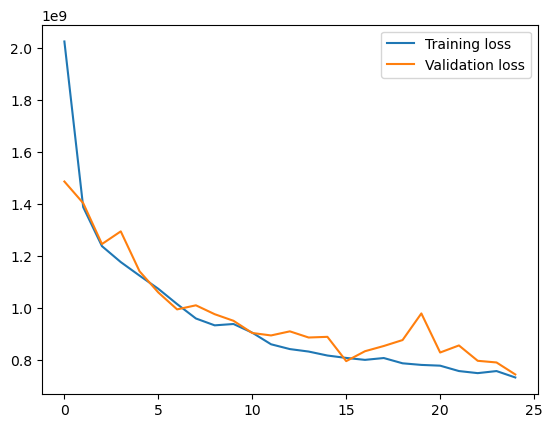

In [21]:
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
# plt.ylim(0, 1e10)  # Adjust y-axis limits for better visualization
plt.legend()
plt.show()

In [39]:
val_dataset.tensors[0].shape

torch.Size([1453, 3, 64, 64])

In [35]:
len(val_loader.dataset.tensors)#.shape

2

In [46]:
val_tensor[0].unsqueeze(0).shape

torch.Size([1, 3, 64, 64])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10499999999999998..1.061].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07149999999999998..1.1425].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024249999999999966..1.6720000000000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06970498039909041..1.2506686419847268].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.036500000000000005..1.113].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1175..1.2990000000000002].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.073..2.882].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10540136106810491..1.4970297449161643].


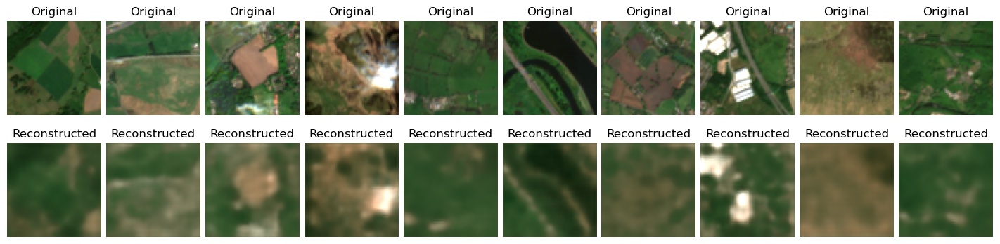

In [47]:
import torch
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vae = vae.to(device)  # Ensure the model is on the correct device

brightness = 5


# Build two rows of 10 images: top row is original, bottom row is reconstructed
plt.figure(figsize=(20, 4))
for i in range(10):
    # Plot original image
    plt.subplot(2, 10, i + 1)
    original_img = val_data[i] #.cpu().numpy()  # Transfer to CPU and convert to NumPy for plotting
    # original_img = np.transpose(original_img, (1, 2, 0))  # Change from (C, H, W) to (H, W, C)
    plt.imshow(unnormalise(original_img) * brightness)
    plt.axis('off')
    plt.title('Original')

    # Plot reconstructed image
    plt.subplot(2, 10, i + 11)
    with torch.no_grad():  # Disable gradient computation for inference
        # Add extra dimension as the model expects a batch dimension and ensure tensor is on the device
        predicted_img, _, _ = vae(val_tensor[i].unsqueeze(0).to(device))
    # Move reconstruction to CPU, detach, convert to NumPy, and squeeze away the batch dimension
    predicted_img = predicted_img.cpu().detach().numpy().squeeze()
    predicted_img = np.transpose(predicted_img, (1, 2, 0))  # Change from (C, H, W) to (H, W, C)
    plt.imshow(unnormalise(predicted_img) * brightness)
    plt.title('Reconstructed')
    plt.axis('off')

# Reduce spacing between images
plt.subplots_adjust(wspace=-0.5, hspace=0.3)
plt.show()


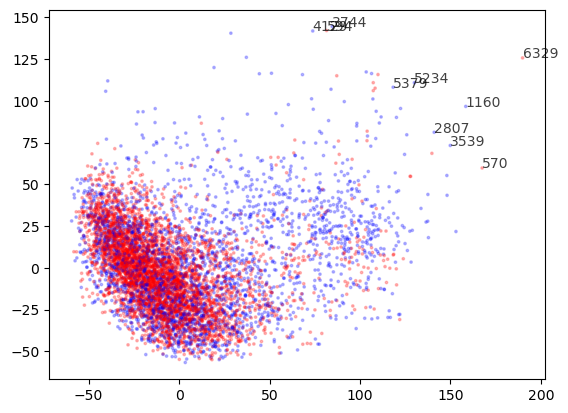

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03875000000000001..0.1844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0456..0.1602].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.037849999999999995..0.1904].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04345..0.3804].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03685..0.2358].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024950000000000003..0.8387999999999999].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). G

Top images furthest from origin:


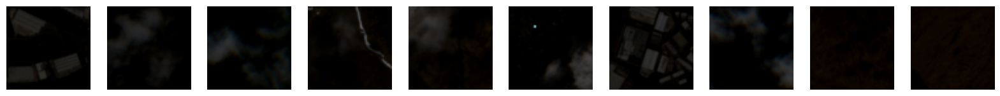

array([6329, 1160,  570, 5234, 3744, 3539,  594, 2807, 5379, 4129])

In [52]:
plot_latent_space_2d(vae.encoder, data, filepaths, brightness=0.5)

<a name="ssl"></a>
# Semi-supervised learning

A pre-trained model such as a VAE can be fine-tuned for a classification task, particularly when labeled data is limited. We will compare the performance of a model that uses a pre-trained autoencoder's learned features against a model that starts with randomly initialised weights.

The combination of unsupervised learning as a 'pretext' task, followed by some supervised learning, is a form of semi-supervised learning.

**Feature Transfer**: The encoder part of an autoencoder has learned to extract essential features from the data during its reconstruction process. We will see how these features, even though initially trained for a different purpose, can be extremely useful for classification.

1. Load a pre-trained autoencoder.
2. Modify the model to be a classifier.
3. Train the model on a semi-supervised dataset.
4. Now remake the autoencoder with random initial weights. Compare the accuracy of the pretrained autoencoder to the untrained one, when finetuned to a classification task.

In [146]:
data.shape

(6953, 64, 64, 3)

In [141]:
#make a classification task to predict whether the location is in Scotland or England. Ensure that the classes are balanced (see sense_ae_metadata.csv)
location = np.array([1 if 'leeds' in i else 0 for i in filepaths])

In [187]:
n=1000
batch_size = 32

# Prepare data for classification
train_data = data[:n]
val_data = data[n:]
train_labels= location[:n]
val_labels = location[n:]

# Prepare the dataset with labels
train_data_tensor = torch.tensor(train_data, dtype=torch.float32).permute(0, 3, 1, 2)
train_labels_tensor = torch.tensor(train_labels, dtype=torch.long)  # Assuming location is your label array

train_dataset = TensorDataset(train_data_tensor, train_labels_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

val_data_tensor = torch.tensor(val_data, dtype=torch.float32).permute(0, 3, 1, 2)
val_labels_tensor = torch.tensor(val_labels, dtype=torch.long)  # Assuming location is your label array

val_dataset = TensorDataset(val_data_tensor, val_labels_tensor)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [188]:
class SimpleClassifier(nn.Module):
    def __init__(self, input_shape=(3, 64, 64), num_classes=2):
        super(SimpleClassifier, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(input_shape[0], 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Flatten())
        self.classifier = nn.Sequential(
            nn.Linear(32 * 16 * 16, 128),  # Adjust based on input shape
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes))
    
    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

# Train the simple classifier
simple_classifier = SimpleClassifier().to(device)
optimizer = torch.optim.Adam(simple_classifier.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

# Use the same training loop as before

In [189]:
vae.forward

<bound method VariationalAutoencoder.forward of VariationalAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ELU(alpha=1.0)
    (2): Dropout(p=0.3, inplace=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): ELU(alpha=1.0)
    (5): Dropout(p=0.3, inplace=False)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): ELU(alpha=1.0)
    (8): Dropout(p=0.3, inplace=False)
    (9): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): ELU(alpha=1.0)
    (11): Dropout(p=0.3, inplace=False)
    (12): Flatten(start_dim=1, end_dim=-1)
  )
  (fc_mu): Linear(in_features=8192, out_features=256, bias=True)
  (fc_var): Linear(in_features=8192, out_features=256, bias=True)
  (decoder): Sequential(
    (0): Linear(in_features=256, out_features=8192, bias=True)
    (1): Unflatten(dim=1, unflattened_size=(128, 8, 8))
    (2): ConvTranspose2d(12

In [156]:
import numpy as np

# Check for NaNs or Infs in the training data
print("NaNs in train_data:", np.isnan(train_data).sum())
print("Infs in train_data:", np.isinf(train_data).sum())

# Check for NaNs or Infs in the validation data
print("NaNs in val_data:", np.isnan(val_data).sum())
print("Infs in val_data:", np.isinf(val_data).sum())

NaNs in train_data: 0
Infs in train_data: 0
NaNs in val_data: 0
Infs in val_data: 0


In [191]:
class SimpleClassifier(nn.Module):
    def __init__(self, input_shape=(3, 64, 64), num_classes=2):
        super(SimpleClassifier, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(input_shape[0], 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Flatten())
        self.classifier = nn.Sequential(
            nn.Linear(32 * 16 * 16, 128),  # Adjust based on input shape
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes))
    
    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

# Train the simple classifier
simple_classifier = SimpleClassifier().to(device)
optimizer = torch.optim.Adam(simple_classifier.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss()

# Use the same training loop as before

In [192]:
# Training loop
epochs = 20
history = {'train_loss': [], 'train_accuracy': [], 'val_loss': [], 'val_accuracy': []}

for epoch in range(epochs):
    simple_classifier.train()
    train_loss = 0.0
    correct = 0
    total = 0
    
    with tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} - Train", unit="batch") as train_bar:
        for x, y in train_bar:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            
            # Forward pass
            logits = simple_classifier(x)
            loss = criterion(logits, y)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item() * x.size(0)
            _, predicted = logits.max(1)
            total += y.size(0)
            correct += predicted.eq(y).sum().item()
            
            train_bar.set_postfix(loss=train_loss / ((train_bar.n + 1) * batch_size), 
                                 accuracy=100. * correct / total)
    
    # Calculate average training loss and accuracy
    train_loss /= len(train_loader.dataset)
    train_accuracy = 100. * correct / total
    history['train_loss'].append(train_loss)
    history['train_accuracy'].append(train_accuracy)
    
    # Validation phase
    val_loss = 0.0
    correct = 0
    total = 0
    simple_classifier.eval()
    with tqdm(val_loader, desc="Validating", unit="batch", leave=False) as val_bar:
        for x, y in val_bar:
            x, y = x.to(device), y.to(device)
            with torch.no_grad():
                logits = simple_classifier(x)
                loss = criterion(logits, y)
            
            val_loss += loss.item() * x.size(0)
            _, predicted = logits.max(1)
            total += y.size(0)
            correct += predicted.eq(y).sum().item()
    
    # Calculate average validation loss and accuracy
    val_loss /= len(val_loader.dataset)
    val_accuracy = 100. * correct / total
    history['val_loss'].append(val_loss)
    history['val_accuracy'].append(val_accuracy)
    
    # Print progress
    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

Epoch 1/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 71.51batch/s, accuracy=59.5, loss=29.5] 


Epoch 1/20, Train Loss: 1.8903, Train Accuracy: 59.50%, Val Loss: 0.7996, Val Accuracy: 62.96%


Epoch 2/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 98.96batch/s, accuracy=68.3, loss=9.66]


Epoch 2/20, Train Loss: 0.6180, Train Accuracy: 68.30%, Val Loss: 0.6456, Val Accuracy: 66.84%


Epoch 3/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 89.30batch/s, accuracy=71.5, loss=8.43]


Epoch 3/20, Train Loss: 0.5396, Train Accuracy: 71.50%, Val Loss: 0.6184, Val Accuracy: 68.96%


Epoch 4/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 103.07batch/s, accuracy=74.8, loss=7.68]


Epoch 4/20, Train Loss: 0.4917, Train Accuracy: 74.80%, Val Loss: 0.6308, Val Accuracy: 69.60%


Epoch 5/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 98.32batch/s, accuracy=79.1, loss=6.81]


Epoch 5/20, Train Loss: 0.4359, Train Accuracy: 79.10%, Val Loss: 0.6103, Val Accuracy: 69.73%


Epoch 6/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 90.50batch/s, accuracy=80.2, loss=6.3] 


Epoch 6/20, Train Loss: 0.4035, Train Accuracy: 80.20%, Val Loss: 0.6660, Val Accuracy: 69.06%


Epoch 7/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 93.39batch/s, accuracy=83.2, loss=0.358] 


Epoch 7/20, Train Loss: 0.3668, Train Accuracy: 83.20%, Val Loss: 0.6486, Val Accuracy: 71.26%


Epoch 8/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 91.87batch/s, accuracy=86.3, loss=4.96]


Epoch 8/20, Train Loss: 0.3177, Train Accuracy: 86.30%, Val Loss: 0.7070, Val Accuracy: 70.79%


Epoch 9/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 95.71batch/s, accuracy=83.9, loss=5.3] 


Epoch 9/20, Train Loss: 0.3393, Train Accuracy: 83.90%, Val Loss: 0.6627, Val Accuracy: 72.45%


Epoch 10/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 92.75batch/s, accuracy=88.1, loss=4.48]


Epoch 10/20, Train Loss: 0.2865, Train Accuracy: 88.10%, Val Loss: 0.7342, Val Accuracy: 71.61%


Epoch 11/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 89.46batch/s, accuracy=89.9, loss=3.9] 


Epoch 11/20, Train Loss: 0.2493, Train Accuracy: 89.90%, Val Loss: 0.7047, Val Accuracy: 71.51%


Epoch 12/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 98.17batch/s, accuracy=91.6, loss=3.2] 


Epoch 12/20, Train Loss: 0.2048, Train Accuracy: 91.60%, Val Loss: 0.8117, Val Accuracy: 72.69%


Epoch 13/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 94.66batch/s, accuracy=91.6, loss=3.34]


Epoch 13/20, Train Loss: 0.2135, Train Accuracy: 91.60%, Val Loss: 0.7628, Val Accuracy: 73.36%


Epoch 14/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 92.25batch/s, accuracy=93.8, loss=2.79]


Epoch 14/20, Train Loss: 0.1785, Train Accuracy: 93.80%, Val Loss: 0.8473, Val Accuracy: 72.60%


Epoch 15/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 90.84batch/s, accuracy=94, loss=2.5]   


Epoch 15/20, Train Loss: 0.1602, Train Accuracy: 94.00%, Val Loss: 0.8016, Val Accuracy: 71.58%


Epoch 16/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 99.64batch/s, accuracy=95.8, loss=2.14]


Epoch 16/20, Train Loss: 0.1369, Train Accuracy: 95.80%, Val Loss: 0.7985, Val Accuracy: 72.80%


Epoch 17/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 90.87batch/s, accuracy=95.2, loss=2.18]


Epoch 17/20, Train Loss: 0.1396, Train Accuracy: 95.20%, Val Loss: 0.9118, Val Accuracy: 73.04%


Epoch 18/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 93.32batch/s, accuracy=97.1, loss=1.64]


Epoch 18/20, Train Loss: 0.1050, Train Accuracy: 97.10%, Val Loss: 0.9418, Val Accuracy: 72.90%


Epoch 19/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 103.79batch/s, accuracy=96.5, loss=1.72]


Epoch 19/20, Train Loss: 0.1102, Train Accuracy: 96.50%, Val Loss: 1.0653, Val Accuracy: 73.11%


Epoch 20/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 86.80batch/s, accuracy=97.3, loss=1.65]
                                                                 

Epoch 20/20, Train Loss: 0.1058, Train Accuracy: 97.30%, Val Loss: 1.0212, Val Accuracy: 72.72%


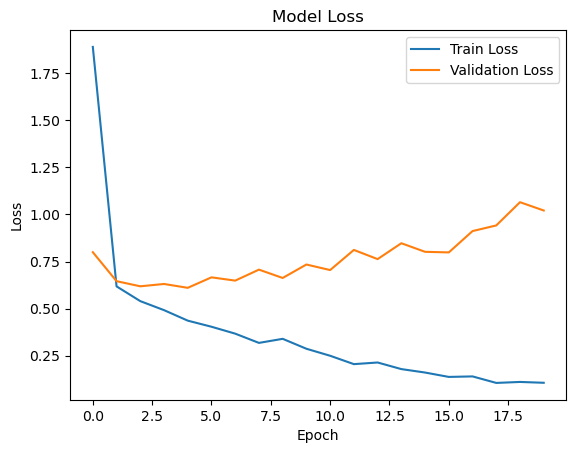

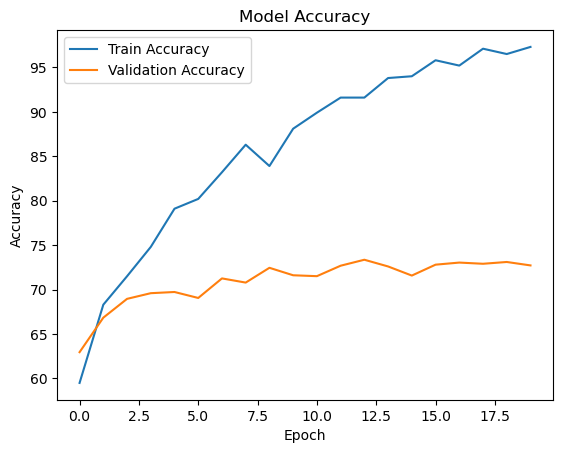

In [193]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training & validation accuracy values
plt.plot(history['train_accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [172]:
vae.eval()

# Test the VAE on a batch of data
with torch.no_grad():
    test_batch = train_data_tensor[:batch_size].to(device)
    recon_batch, mu, log_var = vae(test_batch)
    
    # Check reconstruction
    print("Reconstruction - mean:", recon_batch.mean().item(), "std:", recon_batch.std().item())
    # Check latent space
    print("Latent vector - mean:", mu.mean().item(), "std:", mu.std().item())
    print("Log variance - mean:", log_var.mean().item(), "std:", log_var.std().item())

Reconstruction - mean: 1.922062635421753 std: 82.76224517822266
Latent vector - mean: -0.4058205783367157 std: 38.14091873168945
Log variance - mean: -9.945394515991211 std: 0.6593005061149597


In [ ]:
def reparameterize(self, mu, log_var):
    log_var = torch.clamp(log_var, min=-10, max=10)  # Clamp log_var
    std = torch.exp(0.5 * log_var)
    eps = torch.randn_like(std)
    return mu + eps * std

In [194]:
class VAEClassifier(nn.Module):
    def __init__(self, vae, num_classes=2):
        super(VAEClassifier, self).__init__()
        self.vae = vae
        for param in self.vae.parameters():
            param.requires_grad = False
        self.classifier = nn.Sequential(
            nn.Linear(256, 128),  # Assuming latent_dim is 256
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, num_classes))
        
    def reparameterize(self, mu, log_var):
        log_var = torch.clamp(log_var, min=-10, max=10)  # Clamp log_var
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        return mu + eps * std
    
    def forward(self, x):
        with torch.no_grad():
            encoded = self.vae.encoder(x)
            mu = self.vae.fc_mu(encoded)
            log_var = self.vae.fc_var(encoded)
            log_var = torch.clamp(log_var, min=-10, max=10)  # Clamp log_var
            z = self.reparameterize(mu, log_var)
            
            # Debug: Print latent vector statistics
            # print("Latent vector - mean:", z.mean().item(), "std:", z.std().item())
        
        logits = self.classifier(z)
        
        # Debug: Print logits
        # print("Logits - mean:", logits.mean().item(), "std:", logits.std().item())
        
        return logits

In [195]:
# Initialize the VAEClassifier
vae_classifier = VAEClassifier(vae, num_classes=2).to(device)

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(vae_classifier.parameters(), lr=0.0001)

# Training loop
epochs = 20
history = {'train_loss': [], 'train_accuracy': [], 'val_loss': [], 'val_accuracy': []}

for epoch in range(epochs):
    vae_classifier.train()
    train_loss = 0.0
    correct = 0
    total = 0
    
    with tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} - Train", unit="batch") as train_bar:
        for x, y in train_bar:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            
            # Forward pass
            logits = vae_classifier(x)
            loss = criterion(logits, y)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item() * x.size(0)
            _, predicted = logits.max(1)
            total += y.size(0)
            correct += predicted.eq(y).sum().item()
            
            train_bar.set_postfix(loss=train_loss / ((train_bar.n + 1) * batch_size), 
                                 accuracy=100. * correct / total)
    
    # Calculate average training loss and accuracy
    train_loss /= len(train_loader.dataset)
    train_accuracy = 100. * correct / total
    history['train_loss'].append(train_loss)
    history['train_accuracy'].append(train_accuracy)
    
    # Validation phase
    val_loss = 0.0
    correct = 0
    total = 0
    vae_classifier.eval()
    with tqdm(val_loader, desc="Validating", unit="batch", leave=False) as val_bar:
        for x, y in val_bar:
            x, y = x.to(device), y.to(device)
            with torch.no_grad():
                logits = vae_classifier(x)
                loss = criterion(logits, y)
            
            val_loss += loss.item() * x.size(0)
            _, predicted = logits.max(1)
            total += y.size(0)
            correct += predicted.eq(y).sum().item()
    
    # Calculate average validation loss and accuracy
    val_loss /= len(val_loader.dataset)
    val_accuracy = 100. * correct / total
    history['val_loss'].append(val_loss)
    history['val_accuracy'].append(val_accuracy)
    
    # Print progress
    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

Epoch 1/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 87.45batch/s, accuracy=54.6, loss=72.2]


Epoch 1/20, Train Loss: 4.6237, Train Accuracy: 54.60%, Val Loss: 2.3837, Val Accuracy: 61.77%


Epoch 2/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 95.52batch/s, accuracy=59.8, loss=55.8]


Epoch 2/20, Train Loss: 3.5692, Train Accuracy: 59.80%, Val Loss: 2.1855, Val Accuracy: 62.47%


Epoch 3/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 95.31batch/s, accuracy=60.6, loss=49.7]


Epoch 3/20, Train Loss: 3.1834, Train Accuracy: 60.60%, Val Loss: 2.0590, Val Accuracy: 62.24%


Epoch 4/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 100.20batch/s, accuracy=63.2, loss=41.2]


Epoch 4/20, Train Loss: 2.6359, Train Accuracy: 63.20%, Val Loss: 2.0413, Val Accuracy: 63.45%


Epoch 5/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 89.87batch/s, accuracy=64.3, loss=40.5]


Epoch 5/20, Train Loss: 2.5905, Train Accuracy: 64.30%, Val Loss: 2.0094, Val Accuracy: 63.50%


Epoch 6/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 93.11batch/s, accuracy=67.4, loss=36.2]


Epoch 6/20, Train Loss: 2.3197, Train Accuracy: 67.40%, Val Loss: 1.9156, Val Accuracy: 62.96%


Epoch 7/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 98.70batch/s, accuracy=66.2, loss=31] 


Epoch 7/20, Train Loss: 1.9857, Train Accuracy: 66.20%, Val Loss: 1.9089, Val Accuracy: 62.98%


Epoch 8/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 92.90batch/s, accuracy=65.9, loss=32] 


Epoch 8/20, Train Loss: 2.0493, Train Accuracy: 65.90%, Val Loss: 1.8513, Val Accuracy: 62.98%


Epoch 9/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 102.15batch/s, accuracy=68.6, loss=27.9]


Epoch 9/20, Train Loss: 1.7878, Train Accuracy: 68.60%, Val Loss: 1.7843, Val Accuracy: 63.38%


Epoch 10/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 95.26batch/s, accuracy=69.1, loss=29.2]


Epoch 10/20, Train Loss: 1.8660, Train Accuracy: 69.10%, Val Loss: 1.7607, Val Accuracy: 63.01%


Epoch 11/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 92.31batch/s, accuracy=66.4, loss=31.7]


Epoch 11/20, Train Loss: 2.0271, Train Accuracy: 66.40%, Val Loss: 1.6664, Val Accuracy: 62.22%


Epoch 12/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 88.48batch/s, accuracy=67.8, loss=25.5]


Epoch 12/20, Train Loss: 1.6323, Train Accuracy: 67.80%, Val Loss: 1.7134, Val Accuracy: 63.16%


Epoch 13/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 100.77batch/s, accuracy=69.5, loss=23.1]


Epoch 13/20, Train Loss: 1.4756, Train Accuracy: 69.50%, Val Loss: 1.6365, Val Accuracy: 62.22%


Epoch 14/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 96.44batch/s, accuracy=69.2, loss=24.9]


Epoch 14/20, Train Loss: 1.5967, Train Accuracy: 69.20%, Val Loss: 1.5799, Val Accuracy: 62.30%


Epoch 15/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 92.39batch/s, accuracy=71.3, loss=21.5]


Epoch 15/20, Train Loss: 1.3738, Train Accuracy: 71.30%, Val Loss: 1.5875, Val Accuracy: 62.67%


Epoch 16/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 92.54batch/s, accuracy=70.8, loss=22.9]


Epoch 16/20, Train Loss: 1.4664, Train Accuracy: 70.80%, Val Loss: 1.5462, Val Accuracy: 62.09%


Epoch 17/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 96.53batch/s, accuracy=70.6, loss=20.8]


Epoch 17/20, Train Loss: 1.3295, Train Accuracy: 70.60%, Val Loss: 1.5357, Val Accuracy: 62.51%


Epoch 18/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 100.19batch/s, accuracy=72.2, loss=18.6]


Epoch 18/20, Train Loss: 1.1928, Train Accuracy: 72.20%, Val Loss: 1.5170, Val Accuracy: 63.06%


Epoch 19/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 101.17batch/s, accuracy=74.4, loss=17.4]


Epoch 19/20, Train Loss: 1.1162, Train Accuracy: 74.40%, Val Loss: 1.4685, Val Accuracy: 61.23%


Epoch 20/20 - Train: 100%|██████████| 32/32 [00:00<00:00, 87.59batch/s, accuracy=72.4, loss=17.6]
                                                                 

Epoch 20/20, Train Loss: 1.1295, Train Accuracy: 72.40%, Val Loss: 1.4660, Val Accuracy: 62.36%


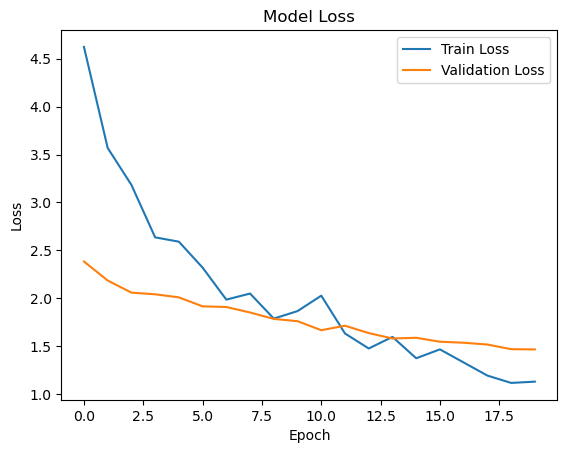

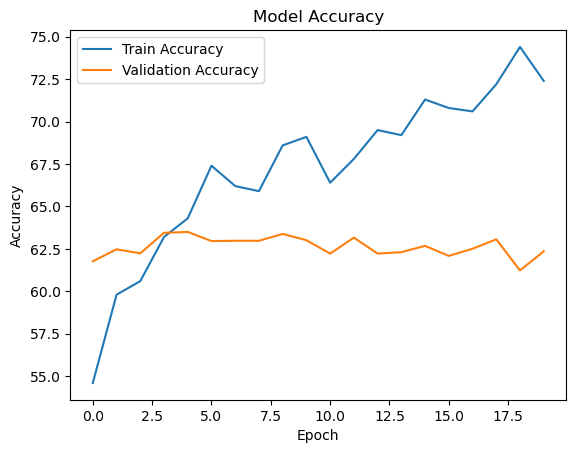

In [197]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training & validation accuracy values
plt.plot(history['train_accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [167]:
# Load the pre-trained VAE model
# vae = VariationalAutoencoder(input_shape=(64, 64, 3), dropout=0.3, latent_dim=256).to(device)
# vae.load_state_dict(torch.load('path_to_pretrained_vae_weights.pth'))
# vae.eval()  # Set the VAE to evaluation mode

# Initialize the VAEClassifier
vae_classifier = VAEClassifier(vae, num_classes=2).to(device)

# Define the loss function and optimizer for classification
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(vae_classifier.parameters(), lr=0.0001)

# Training loop for classification
epochs = 10
history = {'train_loss': [], 'train_accuracy': [], 'val_loss': [], 'val_accuracy': []}

for epoch in range(epochs):
    vae_classifier.train()
    train_loss = 0.0
    correct = 0
    total = 0
    
    with tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} - Train", unit="batch") as train_bar:
        for x, y in train_bar:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            
            # Forward pass
            logits = vae_classifier(x)
            loss = criterion(logits, y)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item() * x.size(0)
            _, predicted = logits.max(1)
            total += y.size(0)
            correct += predicted.eq(y).sum().item()
            
            train_bar.set_postfix(loss=train_loss / ((train_bar.n + 1) * batch_size), 
                                 accuracy=100. * correct / total)
    
    # Calculate average training loss and accuracy
    train_loss /= len(train_loader.dataset)
    train_accuracy = 100. * correct / total
    history['train_loss'].append(train_loss)
    history['train_accuracy'].append(train_accuracy)
    
    # Validation phase
    val_loss = 0.0
    correct = 0
    total = 0
    vae_classifier.eval()
    with tqdm(val_loader, desc="Validating", unit="batch", leave=False) as val_bar:
        for x, y in val_bar:
            x, y = x.to(device), y.to(device)
            with torch.no_grad():
                logits = vae_classifier(x)
                loss = criterion(logits, y)
            
            val_loss += loss.item() * x.size(0)
            _, predicted = logits.max(1)
            total += y.size(0)
            correct += predicted.eq(y).sum().item()
    
    # Calculate average validation loss and accuracy
    val_loss /= len(val_loader.dataset)
    val_accuracy = 100. * correct / total
    history['val_loss'].append(val_loss)
    history['val_accuracy'].append(val_accuracy)
    
    # Print progress
    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

Epoch 1/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 10.43batch/s, accuracy=59, loss=nan]   


Epoch 1/10, Train Loss: nan, Train Accuracy: 59.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 2/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 14.85batch/s, accuracy=41, loss=nan]  


Epoch 2/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 3/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 14.38batch/s, accuracy=41, loss=nan]  


Epoch 3/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 4/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 14.77batch/s, accuracy=41, loss=nan]  


Epoch 4/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 5/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 16.08batch/s, accuracy=41, loss=nan]  


Epoch 5/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 6/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 14.49batch/s, accuracy=41, loss=nan]  


Epoch 6/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 7/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 13.98batch/s, accuracy=41, loss=nan]  


Epoch 7/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 8/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 13.27batch/s, accuracy=41, loss=nan]  


Epoch 8/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 9/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 14.06batch/s, accuracy=41, loss=nan]  


Epoch 9/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 10/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 16.87batch/s, accuracy=41, loss=nan]  
                                                                 

Epoch 10/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


In [159]:
import torch.optim as optim
from tqdm import tqdm

# Initialize the VAEClassifier
vae_classifier = VAEClassifier(vae, num_classes=2).to(device)

# Define the loss function and optimizer for classification
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(vae_classifier.parameters(), lr=0.0001)

# Training loop for classification
epochs = 10
history = {'train_loss': [], 'train_accuracy': [], 'val_loss': [], 'val_accuracy': []}

for epoch in range(epochs):
    vae_classifier.train()
    train_loss = 0.0
    correct = 0
    total = 0
    
    with tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} - Train", unit="batch") as train_bar:
        for x, y in train_bar:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            
            # Forward pass
            logits = vae_classifier(x)
            loss = criterion(logits, y)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item() * x.size(0)
            _, predicted = logits.max(1)
            total += y.size(0)
            correct += predicted.eq(y).sum().item()
            
            train_bar.set_postfix(loss=train_loss / ((train_bar.n + 1) * batch_size), 
                                 accuracy=100. * correct / total)
    
    # Calculate average training loss and accuracy
    train_loss /= len(train_loader.dataset)
    train_accuracy = 100. * correct / total
    history['train_loss'].append(train_loss)
    history['train_accuracy'].append(train_accuracy)
    
    # Validation phase
    val_loss = 0.0
    correct = 0
    total = 0
    vae_classifier.eval()
    with tqdm(val_loader, desc="Validating", unit="batch", leave=False) as val_bar:
        for x, y in val_bar:
            x, y = x.to(device), y.to(device)
            with torch.no_grad():
                logits = vae_classifier(x)
                loss = criterion(logits, y)
            
            val_loss += loss.item() * x.size(0)
            _, predicted = logits.max(1)
            total += y.size(0)
            correct += predicted.eq(y).sum().item()
    
    # Calculate average validation loss and accuracy
    val_loss /= len(val_loader.dataset)
    val_accuracy = 100. * correct / total
    history['val_loss'].append(val_loss)
    history['val_accuracy'].append(val_accuracy)
    
    # Print progress
    print(f"Epoch {epoch + 1}/{epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

Epoch 1/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 10.32batch/s, accuracy=51, loss=nan]  


Latent vector - mean: -455.64898681640625 std: 41202.12109375
Logits - mean: -71.93480682373047 std: 890.7963256835938
Latent vector - mean: 1.3288325071334839 std: 142.2589111328125
Logits - mean: 0.7981832027435303 std: 24.277402877807617
Latent vector - mean: inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: 1.5028856992721558 std: 31.783966064453125
Logits - mean: nan std: nan


Validating:  28%|██▊       | 61/215 [00:00<00:00, 270.75batch/s]

Latent vector - mean: -0.29726263880729675 std: 36.13966751098633
Logits - mean: nan std: nan
Latent vector - mean: 8934149.0 std: 808253696.0
Logits - mean: nan std: nan
Latent vector - mean: -0.6251255869865417 std: 35.167049407958984
Logits - mean: nan std: nan
Latent vector - mean: -0.32717809081077576 std: 32.95549011230469
Logits - mean: nan std: nan
Latent vector - mean: -0.24035556614398956 std: 30.433412551879883
Logits - mean: nan std: nan
Latent vector - mean: -0.539783239364624 std: 32.54273223876953
Logits - mean: nan std: nan
Latent vector - mean: 7457053696.0 std: 582442352640.0
Logits - mean: nan std: nan
Latent vector - mean: -0.4343886077404022 std: 33.73320007324219
Logits - mean: nan std: nan
Latent vector - mean: 12.696303367614746 std: 1190.7291259765625
Logits - mean: nan std: nan
Latent vector - mean: -0.4819388687610626 std: 32.07368850708008
Logits - mean: nan std: nan
Latent vector - mean: -0.04834383726119995 std: 30.546998977661133
Logits - mean: nan std: n

Validating:  80%|████████  | 173/215 [00:00<00:00, 445.94batch/s]

Latent vector - mean: -9142675.0 std: 827500992.0
Logits - mean: nan std: nan
Latent vector - mean: -0.7261975407600403 std: 32.28953170776367
Logits - mean: nan std: nan
Latent vector - mean: -0.19152691960334778 std: 31.684368133544922
Logits - mean: nan std: nan
Latent vector - mean: -185289.625 std: 16770479.0
Logits - mean: nan std: nan
Latent vector - mean: 1.4436457105693082e+18 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -13865.154296875 std: 1251384.875
Logits - mean: nan std: nan
Latent vector - mean: -0.5948426723480225 std: 31.74551010131836
Logits - mean: nan std: nan
Latent vector - mean: inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -0.07146304100751877 std: 30.56592559814453
Logits - mean: nan std: nan
Latent vector - mean: 0.0851929634809494 std: 31.88134002685547
Logits - mean: nan std: nan
Latent vector - mean: -1.049172463583232e+16 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -0.32016441226005554 std: 31.117176055908203

Epoch 1/10, Train Loss: nan, Train Accuracy: 51.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 2/10 - Train:  25%|██▌       | 1/4 [00:00<00:00,  6.76batch/s, accuracy=41, loss=nan]  

Latent vector - mean: 6.13676157752207e+22 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -1.008472204208374 std: 37.267826080322266
Logits - mean: nan std: nan
Latent vector - mean: -0.32870233058929443 std: 48.74657440185547
Logits - mean: nan std: nan


Validating:  28%|██▊       | 60/215 [00:00<00:00, 267.36batch/s]

Latent vector - mean: -0.29712361097335815 std: 36.13969802856445
Logits - mean: nan std: nan
Latent vector - mean: 8725700.0 std: 786293760.0
Logits - mean: nan std: nan
Latent vector - mean: -0.6220335960388184 std: 35.1479606628418
Logits - mean: nan std: nan
Latent vector - mean: -0.3270849287509918 std: 32.955528259277344
Logits - mean: nan std: nan
Latent vector - mean: -0.2401798963546753 std: 30.433393478393555
Logits - mean: nan std: nan
Latent vector - mean: -0.5395113825798035 std: 32.54268264770508
Logits - mean: nan std: nan
Latent vector - mean: -40101048320.0 std: 3553909014528.0
Logits - mean: nan std: nan
Latent vector - mean: -0.43418389558792114 std: 33.73350143432617
Logits - mean: nan std: nan
Latent vector - mean: -36.88805389404297 std: 3297.778076171875
Logits - mean: nan std: nan
Latent vector - mean: -0.4820844531059265 std: 32.07366180419922
Logits - mean: nan std: nan
Latent vector - mean: -0.04831057786941528 std: 30.547229766845703
Logits - mean: nan std: 

Validating:  87%|████████▋ | 186/215 [00:00<00:00, 485.26batch/s]

Latent vector - mean: -0.5910451412200928 std: 31.74087905883789
Logits - mean: nan std: nan
Latent vector - mean: inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -0.07136820256710052 std: 30.566043853759766
Logits - mean: nan std: nan
Latent vector - mean: 0.08603353053331375 std: 31.881860733032227
Logits - mean: nan std: nan
Latent vector - mean: -1.4994226899058688e+16 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -0.3206612765789032 std: 31.116994857788086
Logits - mean: nan std: nan
Latent vector - mean: 0.009184390306472778 std: 31.30071258544922
Logits - mean: nan std: nan
Latent vector - mean: -0.49193716049194336 std: 33.53310775756836
Logits - mean: nan std: nan
Latent vector - mean: -0.21851488947868347 std: 28.96411895751953
Logits - mean: nan std: nan
Latent vector - mean: -0.08772231638431549 std: 30.33531379699707
Logits - mean: nan std: nan
Latent vector - mean: -0.4052702486515045 std: 35.38591384887695
Logits - mean: nan std: nan
Latent ve

Epoch 2/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 3/10 - Train:  25%|██▌       | 1/4 [00:00<00:00,  6.66batch/s, accuracy=41, loss=nan]  

Latent vector - mean: -0.7067179083824158 std: 36.66712951660156
Logits - mean: nan std: nan
Latent vector - mean: nan std: nan
Logits - mean: nan std: nan
Latent vector - mean: -7.0236287117004395 std: 622.9676513671875
Logits - mean: nan std: nan
Latent vector - mean: -0.03587925434112549 std: 37.0204963684082
Logits - mean: nan std: nan


Validating:  26%|██▌       | 55/215 [00:00<00:00, 264.88batch/s]

Latent vector - mean: -0.296888530254364 std: 36.139766693115234
Logits - mean: nan std: nan
Latent vector - mean: -10724863.0 std: 972637568.0
Logits - mean: nan std: nan
Latent vector - mean: -0.6273201704025269 std: 35.18098068237305
Logits - mean: nan std: nan
Latent vector - mean: -0.3271602690219879 std: 32.95555877685547
Logits - mean: nan std: nan
Latent vector - mean: -0.23994362354278564 std: 30.433441162109375
Logits - mean: nan std: nan
Latent vector - mean: -0.5394212007522583 std: 32.542884826660156
Logits - mean: nan std: nan
Latent vector - mean: -3240695040.0 std: 253685727232.0
Logits - mean: nan std: nan
Latent vector - mean: -0.4341224431991577 std: 33.73369216918945
Logits - mean: nan std: nan
Latent vector - mean: 19.839330673217773 std: 1837.0927734375
Logits - mean: nan std: nan
Latent vector - mean: -0.482054740190506 std: 32.07363510131836
Logits - mean: nan std: nan
Latent vector - mean: -0.0483250617980957 std: 30.546993255615234
Logits - mean: nan std: nan


Validating:  81%|████████  | 174/215 [00:00<00:00, 468.80batch/s]

Latent vector - mean: 865630324523008.0 std: 7.834820929807974e+16
Logits - mean: nan std: nan
Latent vector - mean: 41894293798912.0 std: 3791864222187520.0
Logits - mean: nan std: nan
Latent vector - mean: -4154873.75 std: 376054592.0
Logits - mean: nan std: nan
Latent vector - mean: -0.7277852296829224 std: 32.29248809814453
Logits - mean: nan std: nan
Latent vector - mean: -0.19134604930877686 std: 31.684465408325195
Logits - mean: nan std: nan
Latent vector - mean: 156578.125 std: 14171853.0
Logits - mean: nan std: nan
Latent vector - mean: -2.4436470005461156e+18 std: inf
Logits - mean: nan std: nan
Latent vector - mean: 62139.15625 std: 5620837.5
Logits - mean: nan std: nan
Latent vector - mean: -0.595639705657959 std: 31.746313095092773
Logits - mean: nan std: nan
Latent vector - mean: inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -0.07096116244792938 std: 30.565893173217773
Logits - mean: nan std: nan
Latent vector - mean: 0.08429761230945587 std: 31.881195068

Epoch 3/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 4/10 - Train:  25%|██▌       | 1/4 [00:00<00:00,  6.28batch/s, accuracy=41, loss=nan]  

Latent vector - mean: 4.0036351490137186e+29 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -0.3224312961101532 std: 35.07735061645508
Logits - mean: nan std: nan
Latent vector - mean: inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -0.23376011848449707 std: 44.73095703125
Logits - mean: nan std: nan


Validating:  27%|██▋       | 58/215 [00:00<00:00, 284.32batch/s]

Latent vector - mean: -0.29731759428977966 std: 36.13969421386719
Logits - mean: nan std: nan
Latent vector - mean: 831898.4375 std: 78381584.0
Logits - mean: nan std: nan
Latent vector - mean: -0.626007080078125 std: 35.171630859375
Logits - mean: nan std: nan
Latent vector - mean: -0.32722145318984985 std: 32.95552444458008
Logits - mean: nan std: nan
Latent vector - mean: -0.24020256102085114 std: 30.433435440063477
Logits - mean: nan std: nan
Latent vector - mean: -0.5395529270172119 std: 32.542930603027344
Logits - mean: nan std: nan
Latent vector - mean: -26984933376.0 std: 2366943789056.0
Logits - mean: nan std: nan
Latent vector - mean: -0.4339239299297333 std: 33.734214782714844
Logits - mean: nan std: nan
Latent vector - mean: -17.559322357177734 std: 1548.48828125
Logits - mean: nan std: nan
Latent vector - mean: -0.482112318277359 std: 32.073673248291016
Logits - mean: nan std: nan
Latent vector - mean: -0.04822944104671478 std: 30.547029495239258
Logits - mean: nan std: na

Validating:  85%|████████▌ | 183/215 [00:00<00:00, 496.39batch/s]

Latent vector - mean: -1.1067005783957832e+18 std: inf
Logits - mean: nan std: nan
Latent vector - mean: 19478.5625 std: 1756688.875
Logits - mean: nan std: nan
Latent vector - mean: -0.594484806060791 std: 31.744470596313477
Logits - mean: nan std: nan
Latent vector - mean: -inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -0.07102129608392715 std: 30.566024780273438
Logits - mean: nan std: nan
Latent vector - mean: 0.0855458527803421 std: 31.88176727294922
Logits - mean: nan std: nan
Latent vector - mean: 5468990700781568.0 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -0.32021987438201904 std: 31.116788864135742
Logits - mean: nan std: nan
Latent vector - mean: 0.009252786636352539 std: 31.30084228515625
Logits - mean: nan std: nan
Latent vector - mean: -0.49193283915519714 std: 33.53365707397461
Logits - mean: nan std: nan
Latent vector - mean: -0.2184629738330841 std: 28.96406364440918
Logits - mean: nan std: nan
Latent vector - mean: -0.0876075625419616

Epoch 4/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 5/10 - Train:  25%|██▌       | 1/4 [00:00<00:00,  6.66batch/s, accuracy=41, loss=nan]  

Latent vector - mean: -0.5599571466445923 std: 36.44732666015625
Logits - mean: nan std: nan
Latent vector - mean: -0.5175164937973022 std: 37.95774459838867
Logits - mean: nan std: nan
Latent vector - mean: inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -5.43568754196167 std: 48.71965789794922
Logits - mean: nan std: nan


Validating:  26%|██▌       | 56/215 [00:00<00:00, 250.08batch/s]

Latent vector - mean: -0.29725223779678345 std: 36.139705657958984
Logits - mean: nan std: nan
Latent vector - mean: -4070507.25 std: 367504384.0
Logits - mean: nan std: nan
Latent vector - mean: -0.6290279626846313 std: 35.191368103027344
Logits - mean: nan std: nan
Latent vector - mean: -0.32719630002975464 std: 32.95555114746094
Logits - mean: nan std: nan
Latent vector - mean: -0.24012285470962524 std: 30.43336296081543
Logits - mean: nan std: nan
Latent vector - mean: -0.5398039817810059 std: 32.54275131225586
Logits - mean: nan std: nan
Latent vector - mean: -2933874432.0 std: 224997523456.0
Logits - mean: nan std: nan
Latent vector - mean: -0.43434756994247437 std: 33.73381423950195
Logits - mean: nan std: nan
Latent vector - mean: 25.36590003967285 std: 2337.22021484375
Logits - mean: nan std: nan
Latent vector - mean: -0.48226749897003174 std: 32.07373046875
Logits - mean: nan std: nan
Latent vector - mean: -0.048230841755867004 std: 30.546960830688477
Logits - mean: nan std: 

Validating:  76%|███████▋  | 164/215 [00:00<00:00, 424.76batch/s]

Latent vector - mean: -0.38155874609947205 std: 30.073089599609375
Logits - mean: nan std: nan
Latent vector - mean: 5.564920405950464e+16 std: inf
Logits - mean: nan std: nan
Latent vector - mean: 168776.546875 std: 15276934.0
Logits - mean: nan std: nan
Latent vector - mean: -1759202766749696.0 std: 1.592248658433147e+17
Logits - mean: nan std: nan
Latent vector - mean: 378932952039424.0 std: 3.429704473038029e+16
Logits - mean: nan std: nan
Latent vector - mean: -14215049904128.0 std: 1286602684891136.0
Logits - mean: nan std: nan
Latent vector - mean: 9601406.0 std: 869014720.0
Logits - mean: nan std: nan
Latent vector - mean: -0.7275905609130859 std: 32.292823791503906
Logits - mean: nan std: nan
Latent vector - mean: -0.19132345914840698 std: 31.68462371826172
Logits - mean: nan std: nan
Latent vector - mean: -27758.693359375 std: 2512407.25
Logits - mean: nan std: nan
Latent vector - mean: 1.5026116945332142e+18 std: inf
Logits - mean: nan std: nan
Latent vector - mean: 30233.34

Epoch 5/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 6/10 - Train:  25%|██▌       | 1/4 [00:00<00:00,  6.49batch/s, accuracy=41, loss=nan]  

Latent vector - mean: 2.8236785588954636e+32 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -0.5338250994682312 std: 36.17919158935547
Logits - mean: nan std: nan
Latent vector - mean: -inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -0.3753902316093445 std: 41.20439910888672
Logits - mean: nan std: nan


Validating:  25%|██▌       | 54/215 [00:00<00:00, 251.44batch/s]

Latent vector - mean: -0.2973407208919525 std: 36.139671325683594
Logits - mean: nan std: nan
Latent vector - mean: -3216881.5 std: 295357600.0
Logits - mean: nan std: nan
Latent vector - mean: -0.6235254406929016 std: 35.157249450683594
Logits - mean: nan std: nan
Latent vector - mean: -0.3270997703075409 std: 32.955570220947266
Logits - mean: nan std: nan
Latent vector - mean: -0.24038155376911163 std: 30.43337631225586
Logits - mean: nan std: nan
Latent vector - mean: -0.5396913886070251 std: 32.542808532714844
Logits - mean: nan std: nan
Latent vector - mean: -58029522944.0 std: 5169437212672.0
Logits - mean: nan std: nan
Latent vector - mean: -0.4341796636581421 std: 33.7332878112793
Logits - mean: nan std: nan
Latent vector - mean: -13.98381519317627 std: 1224.97412109375
Logits - mean: nan std: nan
Latent vector - mean: -0.4820404052734375 std: 32.07377624511719
Logits - mean: nan std: nan
Latent vector - mean: -0.048216432332992554 std: 30.547033309936523
Logits - mean: nan std

Validating:  80%|████████  | 172/215 [00:00<00:00, 461.90batch/s]

Latent vector - mean: 2.6850026705649664e+16 std: inf
Logits - mean: nan std: nan
Latent vector - mean: 79502.2421875 std: 7196626.0
Logits - mean: nan std: nan
Latent vector - mean: 1763830459793408.0 std: 1.596437110540206e+17
Logits - mean: nan std: nan
Latent vector - mean: -85992694349824.0 std: 7783008484458496.0
Logits - mean: nan std: nan
Latent vector - mean: 12990411702272.0 std: 1175728506798080.0
Logits - mean: nan std: nan
Latent vector - mean: 759096.125 std: 68706424.0
Logits - mean: nan std: nan
Latent vector - mean: -0.7344459891319275 std: 32.31595230102539
Logits - mean: nan std: nan
Latent vector - mean: -0.19115135073661804 std: 31.684858322143555
Logits - mean: nan std: nan
Latent vector - mean: 277703.59375 std: 25134882.0
Logits - mean: nan std: nan
Latent vector - mean: -1.7526802211080765e+18 std: inf
Logits - mean: nan std: nan
Latent vector - mean: 71534.3359375 std: 6457250.0
Logits - mean: nan std: nan
Latent vector - mean: -0.593220591545105 std: 31.74234

Epoch 6/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 7/10 - Train:  25%|██▌       | 1/4 [00:00<00:00,  6.52batch/s, accuracy=41, loss=nan]  

Latent vector - mean: -inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -1.5442478656768799 std: 66.88745880126953
Logits - mean: nan std: nan
Latent vector - mean: -0.3149781823158264 std: 34.85064697265625
Logits - mean: nan std: nan
Latent vector - mean: -1.0383474826812744 std: 40.1633415222168
Logits - mean: nan std: nan


Validating:  22%|██▏       | 48/215 [00:00<00:00, 231.73batch/s]

Latent vector - mean: -0.2972280979156494 std: 36.139705657958984
Logits - mean: nan std: nan
Latent vector - mean: 283553.84375 std: 27754406.0
Logits - mean: nan std: nan
Latent vector - mean: -0.6260731220245361 std: 35.17470932006836
Logits - mean: nan std: nan
Latent vector - mean: -0.32713592052459717 std: 32.9555549621582
Logits - mean: nan std: nan
Latent vector - mean: -0.24037818610668182 std: 30.4334774017334
Logits - mean: nan std: nan
Latent vector - mean: -0.53965163230896 std: 32.542728424072266
Logits - mean: nan std: nan
Latent vector - mean: -51879817216.0 std: 4758361866240.0
Logits - mean: nan std: nan
Latent vector - mean: -0.43381738662719727 std: 33.73429870605469
Logits - mean: nan std: nan
Latent vector - mean: -35.66545486450195 std: 3187.092041015625
Logits - mean: nan std: nan
Latent vector - mean: -0.48200368881225586 std: 32.07377243041992
Logits - mean: nan std: nan
Latent vector - mean: -0.04847295582294464 std: 30.547208786010742
Logits - mean: nan std:

Validating:  80%|████████  | 173/215 [00:00<00:00, 475.05batch/s]

Logits - mean: nan std: nan
Latent vector - mean: -0.38167518377304077 std: 30.072965621948242
Logits - mean: nan std: nan
Latent vector - mean: -9428599970988032.0 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -103216.640625 std: 9339837.0
Logits - mean: nan std: nan
Latent vector - mean: -5316705119109120.0 std: inf
Logits - mean: nan std: nan
Latent vector - mean: 964438865739776.0 std: 8.72912417414185e+16
Logits - mean: nan std: nan
Latent vector - mean: -25432346853376.0 std: 2301868931809280.0
Logits - mean: nan std: nan
Latent vector - mean: 12599336.0 std: 1140370048.0
Logits - mean: nan std: nan
Latent vector - mean: -0.7364506125450134 std: 32.32572937011719
Logits - mean: nan std: nan
Latent vector - mean: -0.19135797023773193 std: 31.684646606445312
Logits - mean: nan std: nan
Latent vector - mean: 1122175.25 std: 101567736.0
Logits - mean: nan std: nan
Latent vector - mean: -9.214734823262781e+17 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -912

Epoch 7/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 8/10 - Train:  25%|██▌       | 1/4 [00:00<00:00,  6.72batch/s, accuracy=41, loss=nan]  

Latent vector - mean: -0.8474489450454712 std: 37.77874755859375
Logits - mean: nan std: nan
Latent vector - mean: 1.6671677827835083 std: 196.5267333984375
Logits - mean: nan std: nan
Latent vector - mean: -inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: 1.2228214740753174 std: 41.187461853027344
Logits - mean: nan std: nan


Validating:  11%|█         | 23/215 [00:00<00:01, 110.25batch/s]

Latent vector - mean: -0.29710260033607483 std: 36.1396598815918
Logits - mean: nan std: nan
Latent vector - mean: -6634481.5 std: 600734656.0
Logits - mean: nan std: nan
Latent vector - mean: -0.6276421546936035 std: 35.183738708496094
Logits - mean: nan std: nan
Latent vector - mean: -0.32711100578308105 std: 32.95558547973633
Logits - mean: nan std: nan
Latent vector - mean: -0.2402074784040451 std: 30.433456420898438
Logits - mean: nan std: nan
Latent vector - mean: -0.5399078130722046 std: 32.54273986816406
Logits - mean: nan std: nan
Latent vector - mean: 7205618176.0 std: 784936271872.0
Logits - mean: nan std: nan
Latent vector - mean: -0.43377524614334106 std: 33.73443603515625
Logits - mean: nan std: nan
Latent vector - mean: 1.92904794216156 std: 218.1639862060547
Logits - mean: nan std: nan
Latent vector - mean: -0.4821590781211853 std: 32.07368087768555
Logits - mean: nan std: nan
Latent vector - mean: -0.04869192838668823 std: 30.547090530395508
Logits - mean: nan std: nan

Validating:  64%|██████▍   | 138/215 [00:00<00:00, 399.65batch/s]

Latent vector - mean: -1.845092535018921 std: 171.3857879638672
Logits - mean: nan std: nan
Latent vector - mean: -0.47244560718536377 std: 29.703960418701172
Logits - mean: nan std: nan
Latent vector - mean: -0.1311180293560028 std: 34.1414794921875
Logits - mean: nan std: nan
Latent vector - mean: 20681074933760.0 std: 1871837210345472.0
Logits - mean: nan std: nan
Latent vector - mean: -0.5252484679222107 std: 32.256839752197266
Logits - mean: nan std: nan
Latent vector - mean: -inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -599910.0 std: 54297564.0
Logits - mean: nan std: nan
Latent vector - mean: -0.16677667200565338 std: 30.629528045654297
Logits - mean: nan std: nan
Latent vector - mean: -0.4529787600040436 std: 33.42623519897461
Logits - mean: nan std: nan
Latent vector - mean: -0.390695184469223 std: 32.756996154785156
Logits - mean: nan std: nan
Latent vector - mean: inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: 7253816.5 std: 656540544.0
Log

Latent vector - mean: 2.357016789818696e+34 std: inf
Logits - mean: nan std: nan
Latent vector - mean: 30.0035400390625 std: 2791.120361328125
Logits - mean: nan std: nan
Latent vector - mean: -0.20289674401283264 std: 32.797752380371094
Logits - mean: nan std: nan
Latent vector - mean: -0.1865767538547516 std: 32.29599380493164
Logits - mean: nan std: nan
Latent vector - mean: 0.03960795700550079 std: 28.83763313293457
Logits - mean: nan std: nan
Latent vector - mean: -0.48663386702537537 std: 31.623689651489258
Logits - mean: nan std: nan
Latent vector - mean: 6.99113130569458 std: 694.1980590820312
Logits - mean: nan std: nan
Latent vector - mean: -0.032348282635211945 std: 27.346181869506836
Logits - mean: nan std: nan
Latent vector - mean: 0.02564847469329834 std: 31.68625259399414
Logits - mean: nan std: nan
Latent vector - mean: -0.6221522688865662 std: 32.73838424682617
Logits - mean: nan std: nan
Latent vector - mean: -inf std: nan
Logits - mean: nan std: nan
Latent vector - m

Epoch 9/10 - Train: 100%|██████████| 4/4 [00:00<00:00, 14.60batch/s, accuracy=41, loss=nan]  


Latent vector - mean: -inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -8.99009895324707 std: 753.2763671875
Logits - mean: nan std: nan
Latent vector - mean: 8.781019113967221e+26 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -1.195526361465454 std: 51.908504486083984
Logits - mean: nan std: nan


Validating:  29%|██▉       | 63/215 [00:00<00:00, 311.95batch/s]

Latent vector - mean: -0.29738175868988037 std: 36.13966369628906
Logits - mean: nan std: nan
Latent vector - mean: -3765222.25 std: 341705472.0
Logits - mean: nan std: nan
Latent vector - mean: -0.6266649961471558 std: 35.174835205078125
Logits - mean: nan std: nan
Latent vector - mean: -0.327243447303772 std: 32.95553970336914
Logits - mean: nan std: nan
Latent vector - mean: -0.24004893004894257 std: 30.43333625793457
Logits - mean: nan std: nan
Latent vector - mean: -0.5397520065307617 std: 32.54283142089844
Logits - mean: nan std: nan
Latent vector - mean: 10915479552.0 std: 1031431520256.0
Logits - mean: nan std: nan
Latent vector - mean: -0.4335497319698334 std: 33.734500885009766
Logits - mean: nan std: nan
Latent vector - mean: 10.172988891601562 std: 962.4459838867188
Logits - mean: nan std: nan
Latent vector - mean: -0.4822062849998474 std: 32.07360076904297
Logits - mean: nan std: nan
Latent vector - mean: -0.048356011509895325 std: 30.547035217285156
Logits - mean: nan std

Validating:  82%|████████▏ | 176/215 [00:00<00:00, 469.94batch/s]

Latent vector - mean: 1.6914077366270034e+18 std: inf
Logits - mean: nan std: nan
Latent vector - mean: 18145.974609375 std: 1630370.75
Logits - mean: nan std: nan
Latent vector - mean: -0.5941174030303955 std: 31.744783401489258
Logits - mean: nan std: nan
Latent vector - mean: inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: -0.07142037898302078 std: 30.56606674194336
Logits - mean: nan std: nan
Latent vector - mean: 0.08522579073905945 std: 31.88141632080078
Logits - mean: nan std: nan
Latent vector - mean: -976532554121216.0 std: 8.838564235811226e+16
Logits - mean: nan std: nan
Latent vector - mean: -0.32063865661621094 std: 31.116853713989258
Logits - mean: nan std: nan
Latent vector - mean: 0.009354978799819946 std: 31.30084228515625
Logits - mean: nan std: nan
Latent vector - mean: -0.4930696487426758 std: 33.53536605834961
Logits - mean: nan std: nan
Latent vector - mean: -0.21889139711856842 std: 28.9638729095459
Logits - mean: nan std: nan
Latent vector - mean:

Epoch 9/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


Epoch 10/10 - Train:  25%|██▌       | 1/4 [00:00<00:00,  6.44batch/s, accuracy=41, loss=nan]  

Latent vector - mean: 11545.65234375 std: 1045072.125
Logits - mean: nan std: nan
Latent vector - mean: inf std: nan
Logits - mean: nan std: nan
Latent vector - mean: 2.1165287101151293e+21 std: inf
Logits - mean: nan std: nan
Latent vector - mean: -1.9746814966201782 std: 32.371002197265625
Logits - mean: nan std: nan


Validating:  29%|██▉       | 63/215 [00:00<00:00, 302.74batch/s]

Latent vector - mean: -0.2970247268676758 std: 36.139671325683594
Logits - mean: nan std: nan
Latent vector - mean: -8724374.0 std: 791562944.0
Logits - mean: nan std: nan
Latent vector - mean: -0.6254413723945618 std: 35.16704177856445
Logits - mean: nan std: nan
Latent vector - mean: -0.32698312401771545 std: 32.955482482910156
Logits - mean: nan std: nan
Latent vector - mean: -0.24006417393684387 std: 30.43343734741211
Logits - mean: nan std: nan
Latent vector - mean: -0.5397599339485168 std: 32.542877197265625
Logits - mean: nan std: nan
Latent vector - mean: 21664774144.0 std: 1954461777920.0
Logits - mean: nan std: nan
Latent vector - mean: -0.43428516387939453 std: 33.7335090637207
Logits - mean: nan std: nan
Latent vector - mean: 36.65868377685547 std: 3359.266357421875
Logits - mean: nan std: nan
Latent vector - mean: -0.48214900493621826 std: 32.073753356933594
Logits - mean: nan std: nan
Latent vector - mean: -0.048468202352523804 std: 30.547239303588867
Logits - mean: nan s

Validating:  86%|████████▌ | 184/215 [00:00<00:00, 488.57batch/s]

Latent vector - mean: -0.07145092636346817 std: 30.5660343170166
Logits - mean: nan std: nan
Latent vector - mean: 0.08523440361022949 std: 31.88157081604004
Logits - mean: nan std: nan
Latent vector - mean: -1667896728092672.0 std: 1.509607818301276e+17
Logits - mean: nan std: nan
Latent vector - mean: -0.3202199935913086 std: 31.11732292175293
Logits - mean: nan std: nan
Latent vector - mean: 0.009202778339385986 std: 31.300668716430664
Logits - mean: nan std: nan
Latent vector - mean: -0.49166548252105713 std: 33.532798767089844
Logits - mean: nan std: nan
Latent vector - mean: -0.21882840991020203 std: 28.963703155517578
Logits - mean: nan std: nan
Latent vector - mean: -0.08746307343244553 std: 30.33513832092285
Logits - mean: nan std: nan
Latent vector - mean: -0.40600502490997314 std: 35.385406494140625
Logits - mean: nan std: nan
Latent vector - mean: -0.49593809247016907 std: 32.79514694213867
Logits - mean: nan std: nan
Latent vector - mean: -0.7010594606399536 std: 31.095279

Epoch 10/10, Train Loss: nan, Train Accuracy: 41.00%, Val Loss: nan, Val Accuracy: 38.04%


In [91]:
import torch
import torch.nn as nn
import torch.optim as optim

class VAECls(nn.Module):
    def __init__(self, vae):
        super(VAECls, self).__init__()
        # Use encoder part from VAE
        self.encoder = vae.encoder
        
        # Assuming the final part of the encoder outputs features of size `latent_dim`
        latent_dim = 256  # You should set this according to your VAE settings
        
        # Append a new layer for binary classification
        self.classifier = nn.Sequential(
            nn.Linear(latent_dim, 1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        out = self.classifier(encoded)
        return out



In [126]:
class VAECls(nn.Module):
    def __init__(self, vae, pretrained=True, output_features=256):
        super(VAECls, self).__init__()
        self.encoder = vae.encoder  # Assuming the encoder part is what you need
        
        # Find last encoded feature size automatically if not known (inspect the encoder output)
        self._temp_x = torch.randn(3, 64, 64).to(device)  # Replace `x_shape` with the shape of your input images
        if pretrained==True:
            self._temp_x = self.encoder(self._temp_x).view(-1).shape[0]
        # self._temp_x = self.encoder(self._temp_x).view(-1).shape[0]
        
        # Define a classifier network
        self.classifier = nn.Sequential(
            nn.Linear(self._temp_x, output_features),  # Assuming the flattened features are `self._temp_x` size
            nn.ReLU(),
            nn.Linear(output_features, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)  # Flatten the features
        x = self.classifier(x)
        return x


In [ ]:
# # Assuming `vae` is your already trained VAE model loaded and moved to the appropriate device
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# vae_model = VAECls(vae)

# # Move the model to the correct device
# vae_model = vae_model.to(device)

# # Compile the model with optimizer and loss function for binary classification
# optimizer = optim.Adam(vae_model.parameters(), lr=0.001)
# criterion = nn.BCELoss()

# # Assume `training_data` and `labels` have been defined and loaded here
# # Example forward pass (training)
# # You should further complete this with a full training loop including loading your data
# vae_model.train()
# for data, target in training_loader:  # training_loader should be set up to load your data and labels
#     data, target = data.to(device), target.to(device)
#     optimizer.zero_grad()
#     outputs = vae_model(data)
#     loss = criterion(outputs, target.float().unsqueeze(1))  # Ensure target is the correct shape and type
#     loss.backward()
#     optimizer.step()


In [88]:
#make a classification task to predict whether the location is in Scotland or England. Ensure that the classes are balanced (see sense_ae_metadata.csv)
location = np.array([1 if 'leeds' in i else 0 for i in filepaths])

In [144]:
data.shape

(6953, 64, 64, 3)

In [97]:
import torch
from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms
import numpy as np

# Convert numpy arrays to tensors
data_tensor = torch.tensor(data, dtype=torch.float32)
# Change data to (N, C, H, W) format expected by PyTorch Conv2D layers
data_tensor = data_tensor.permute(0, 3, 1, 2)
location_tensor = torch.tensor(location, dtype=torch.float32)

# Create dataset and dataloader - restrict training to only 100 samples
train_dataset = TensorDataset(data_tensor[:100], location_tensor[:100])
train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)

# Validation dataset
val_dataset = TensorDataset(data_tensor[100:], location_tensor[100:])
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=False)

# Ensure data are in the format (N, C, H, W) and normalized if necessary
# This might already be handled. If not, use an appropriate `transform`.


In [98]:
# Assuming `vae` is your already trained VAE model loaded and moved to the appropriate device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vae_model = VAECls(vae)

# Assuming VAECls is defined and instantiated as vae_model
vae_model.to(device)

# Define the optimizer and criterion
optimizer = torch.optim.Adam(vae_model.parameters(), lr=0.001)
criterion = torch.nn.BCELoss()  # Binary Cross-Entropy Loss for binary classification


In [107]:
data_tensor.shape

torch.Size([6953, 3, 64, 64])

In [127]:
import torch
from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms
import numpy as np

# Convert numpy arrays to tensors
data_tensor = torch.tensor(data, dtype=torch.float32)
# Change data to (N, C, H, W) format expected by PyTorch Conv2D layers
data_tensor = data_tensor.permute(0, 3, 1, 2)
location_tensor = torch.tensor(location, dtype=torch.float32)

# Create dataset and dataloader - restrict training to only 100 samples
train_dataset = TensorDataset(data_tensor[:100], location_tensor[:100])
train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)

# Validation dataset
val_dataset = TensorDataset(data_tensor[100:], location_tensor[100:])
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=False)

# Ensure data are in the format (N, C, H, W) and normalized if necessary
# This might already be handled. If not, use an appropriate `transform`.


# Assuming `vae` is your already trained VAE model loaded and moved to the appropriate device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# vae_model = VAECls(vae, pretrained=False)
vae_model = VAECls(vae, pretrained=True)

# Assuming VAECls is defined and instantiated as vae_model
vae_model.to(device)

# Define the optimizer and criterion
optimizer = torch.optim.Adam(vae_model.parameters(), lr=0.001)
criterion = torch.nn.BCELoss()  # Binary Cross-Entropy Loss for binary classification

# Define the number of epochs
epochs = 10

for epoch in range(epochs):
    vae_model.train()  # Set the model to training mode
    train_loss = 0.0

    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)

        # Forward pass
        outputs = vae_model(imgs).squeeze()  # Ensure output shape matches the labels shape
        loss = criterion(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)

    # Validation Loss
    vae_model.eval()  # Set the model to evaluation mode
    val_loss = 0.0
    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = vae_model(imgs).squeeze()
            loss = criterion(outputs, labels)
            val_loss += loss.item() * imgs.size(0)

    # Print training and validation loss
    print(f'Epoch [{epoch+1}/{epochs}], '
          f'Train Loss: {train_loss / 100:.4f}, '
          f'Val Loss: {val_loss / (len(data)-100):.4f}')


Epoch [1/10], Train Loss: 1.3447, Val Loss: 0.9174
Epoch [2/10], Train Loss: 0.2866, Val Loss: 0.8154
Epoch [3/10], Train Loss: 0.1106, Val Loss: 0.9350
Epoch [4/10], Train Loss: 0.0454, Val Loss: 1.1163
Epoch [5/10], Train Loss: 0.0134, Val Loss: 1.2834
Epoch [6/10], Train Loss: 0.0037, Val Loss: 1.3942
Epoch [7/10], Train Loss: 0.0127, Val Loss: 1.4951
Epoch [8/10], Train Loss: 0.0047, Val Loss: 1.6007
Epoch [9/10], Train Loss: 0.0045, Val Loss: 1.8033
Epoch [10/10], Train Loss: 0.0013, Val Loss: 1.9433


In [130]:
import torch
from torch.utils.data import DataLoader, TensorDataset
import numpy as np

# Given: data_tensor, location_tensor setup correctly as shown previously in the question.

# Create dataset and dataloader
train_dataset = TensorDataset(data_tensor[:100], location_tensor[:100])
train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)

val_dataset = TensorDataset(data_tensor[100:], location_tensor[100:])
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=False)

# Assuming a correctly setup VAECls model and transferred to an appropriate device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vae_model = VAECls(vae, pretrained=False).to(device)  # Ensure that VAECls uses the VAE encoder and has a classification layer

# Optimizer and loss function setup
optimizer = torch.optim.Adam(vae_model.parameters(), lr=0.001)
criterion = torch.nn.BCELoss()

# Metrics storage
history = {
    'train_loss': [],
    'val_loss': [],
    'train_accuracy': [],
    'val_accuracy': []
}

epochs = 10

for epoch in range(epochs):
    vae_model.train()
    train_loss, train_correct, train_total = 0, 0, 0

    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        outputs = vae_model(imgs).squeeze()
        loss = criterion(outputs, labels)
        predicted = (outputs > 0.5).float()
        train_correct += (predicted == labels).sum().item()
        train_total += labels.size(0)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)

    train_accuracy = 100 * train_correct / train_total
    history['train_loss'].append(train_loss / len(train_loader.dataset))
    history['train_accuracy'].append(train_accuracy)

    # Validation
    vae_model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = vae_model(imgs).squeeze()
            loss = criterion(outputs, labels)
            predicted = (outputs > 0.5).float()
            val_correct += (predicted == labels).sum().item()
            val_total += labels.size(0)
            val_loss += loss.item() * imgs.size(0)

    val_accuracy = 100 * val_correct / val_total
    history['val_loss'].append(val_loss / len(val_loader.dataset))
    history['val_accuracy'].append(val_accuracy)

    print(f'Epoch {epoch + 1}/{epochs}, Train Loss: {history["train_loss"][-1]:.4f}, Train Acc: {train_accuracy:.2f}%, ' +
          f'Val Loss: {history["val_loss"][-1]:.4f}, Val Acc: {val_accuracy:.2f}%')

# You can now use `history` for plotting or other analyses as required:



TypeError: empty(): argument 'size' failed to unpack the object at pos 2 with error "type must be tuple of ints,but got Tensor"

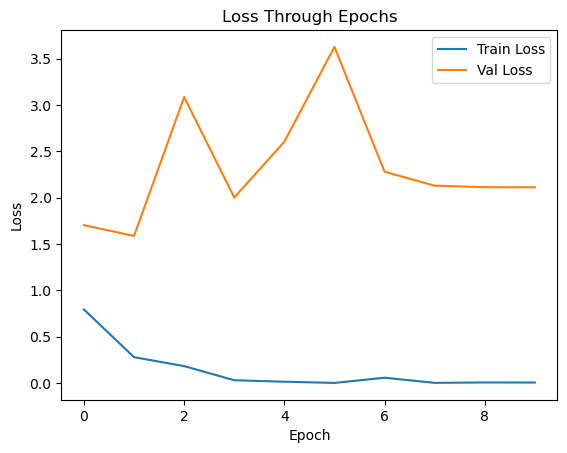

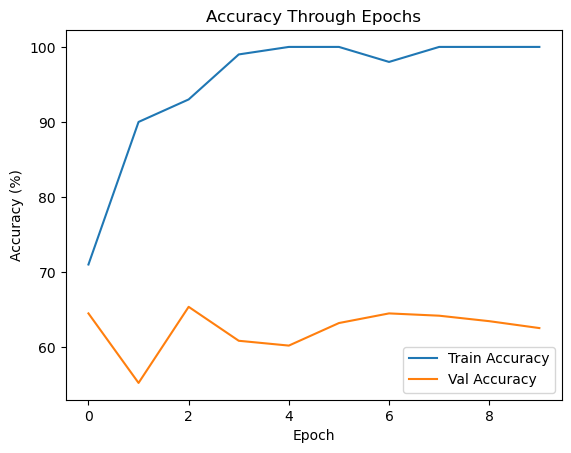

In [129]:
import matplotlib.pyplot as plt

# Plotting Loss
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Val Loss')
plt.title('Loss Through Epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

# Plotting Accuracy
plt.plot(history['train_accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy Through Epochs')
plt.ylabel('Accuracy (%)')
plt.xlabel('Epoch')
plt.legend()
plt.show()

In [125]:
import torch
import matplotlib.pyplot as plt

history = {
    'train_loss': [],
    'val_loss': [],
    'train_accuracy': [],
    'val_accuracy': []
}

epochs = 10
for epoch in range(epochs):
    vae_model.train()  # Set the model to training mode
    train_loss = 0.0
    correct = 0
    total = 0

    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = vae_model(imgs).squeeze(1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)
        predicted = (outputs > 0.5).float()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_accuracy = 100 * correct / total
    history['train_loss'].append(train_loss / len(train_loader.dataset))
    history['train_accuracy'].append(train_accuracy)

    # Validation phase
    vae_model.eval()  # Set the model to evaluation mode
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = vae_model(imgs).squeeze(1)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * imgs.size(0)
            predicted = (outputs > 0.5).float()
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_accuracy = 100 * correct / total
    history['val_loss'].append(val_loss / len(val_loader.dataset))
    history['val_accuracy'].append(val_accuracy)

    print(f'Epoch {epoch+1}, Train Loss: {history["train_loss"][-1]:.4f}, Train Acc: {train_accuracy:.2f}%, '
          f'Val Loss: {history["val_loss"][-1]:.4f}, Val Acc: {val_accuracy:.2f}%')


Epoch 1, Train Loss: 0.0003, Train Acc: 100.00%, Val Loss: 3.6685, Val Acc: 60.38%
Epoch 2, Train Loss: 0.0002, Train Acc: 100.00%, Val Loss: 3.6678, Val Acc: 60.24%
Epoch 3, Train Loss: 0.0003, Train Acc: 100.00%, Val Loss: 3.7127, Val Acc: 60.22%
Epoch 4, Train Loss: 0.0002, Train Acc: 100.00%, Val Loss: 3.8065, Val Acc: 60.34%
Epoch 5, Train Loss: 0.0001, Train Acc: 100.00%, Val Loss: 3.9021, Val Acc: 60.47%
Epoch 6, Train Loss: 0.0003, Train Acc: 100.00%, Val Loss: 3.9303, Val Acc: 60.32%
Epoch 7, Train Loss: 0.0001, Train Acc: 100.00%, Val Loss: 3.9600, Val Acc: 60.22%
Epoch 8, Train Loss: 0.0002, Train Acc: 100.00%, Val Loss: 3.9824, Val Acc: 60.15%
Epoch 9, Train Loss: 0.0001, Train Acc: 100.00%, Val Loss: 4.0184, Val Acc: 60.15%
Epoch 10, Train Loss: 0.0005, Train Acc: 100.00%, Val Loss: 4.0387, Val Acc: 60.16%


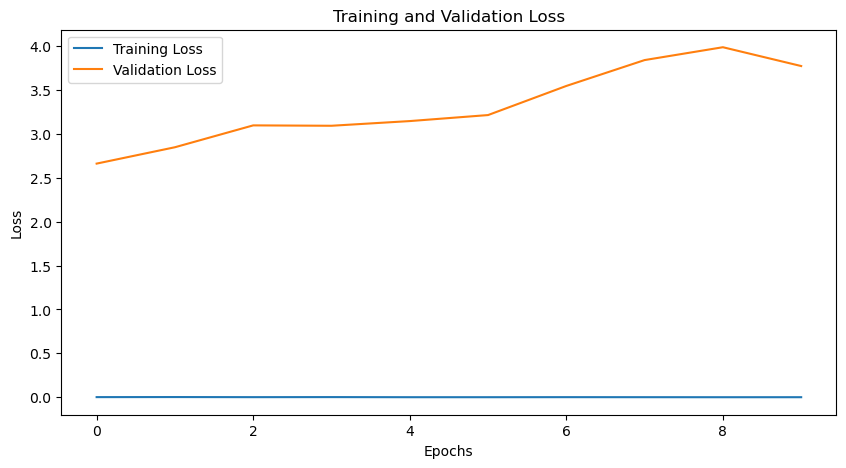

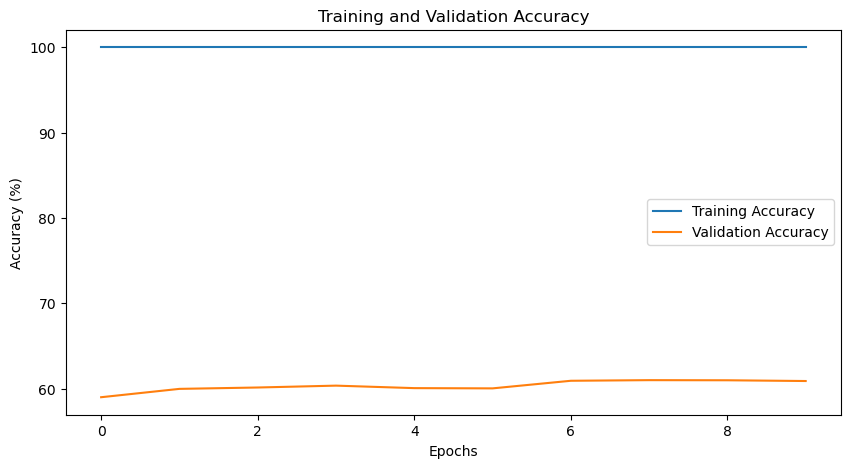

In [121]:
# Plotting Loss
plt.figure(figsize=(10, 5))
plt.plot(history['train_loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plotting Accuracy
plt.figure(figsize=(10, 5))
plt.plot(history['train_accuracy'], label='Training Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title("Training and Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy (%)")
plt.legend()
plt.show()


In [ ]:
# VAE model, optimizer setup
vae = VariationalAutoencoder(input_shape=(64, 64, 3), dropout=0.3, latent_dim=256).to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr=0.001)
loss_fn = nn.MSELoss()


In [100]:
# import torch
# from torch.utils.data import DataLoader, TensorDataset
# from sklearn.model_selection import train_test_split
# import numpy as np

# # Assuming `data` is your image data loaded in an (N, H, W, C) format and `location` are the labels
# data_tensor = torch.tensor(data).float()
# location_tensor = torch.tensor(location).float()

# # Change data to (N, C, H, W) format expected by PyTorch Conv2D layers
# data_tensor = data_tensor.permute(0, 3, 1, 2)

# # Split into training and validation sets
# train_data, valid_data, train_labels, valid_labels = train_test_split(
#     data_tensor, location_tensor, test_size=0.99, random_state=42, stratify=location  # using a large test size for quick example; adjust accordingly
# )

# # Create DataLoaders for training and validation sets
# batch_size = 10
# train_dataset = TensorDataset(train_data, train_labels)
# valid_dataset = TensorDataset(valid_data, valid_labels)

# train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
# valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)

# # Assuming VAECls and vae_model are defined and setup correctly
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# vae_model = VAECls(vae).to(device)  # Make sure your model class is correctly initialized

# optimizer = torch.optim.Adam(vae_model.parameters(), lr=0.001)
# criterion = torch.nn.BCELoss()

# Training Loop
vae_model.train()  # Set the model to training mode
for epoch in range(10):  # Assuming you want to run for 10 epochs
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = vae_model(inputs).squeeze(1)  # Ensure outputs and labels dimensions match
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    print(f'Epoch {epoch+1}, Loss: {loss.item()}')


RuntimeError: mat1 and mat2 shapes cannot be multiplied (10x8192 and 256x1)

In [131]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import numpy as np

# Assuming `vae` is your already trained VAE model loaded and moved to the appropriate device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the VAE Classification model
class VAECls(nn.Module):
    def __init__(self, vae, pretrained=True, output_features=256):
        super(VAECls, self).__init__()
        self.encoder = vae.encoder  # Assuming the encoder part is what you need
        
        # Find last encoded feature size automatically if not known (inspect the encoder output)
        self._temp_x = torch.randn(3, 64, 64).to(device)  # Replace `x_shape` with the shape of your input images
        if pretrained:
            self._temp_x = self.encoder(self._temp_x).view(-1).shape[0]
        
        # Define a classifier network
        self.classifier = nn.Sequential(
            nn.Linear(self._temp_x, output_features),  # Assuming the flattened features are `self._temp_x` size
            nn.ReLU(),
            nn.Linear(output_features, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)  # Flatten the features
        x = self.classifier(x)
        return x

# Convert numpy arrays to tensors
data_tensor = torch.tensor(data, dtype=torch.float32)
data_tensor = data_tensor.permute(0, 3, 1, 2)  # Change data to (N, C, H, W) format
location_tensor = torch.tensor(location, dtype=torch.float32)

# Create dataset and dataloader - restrict training to only 100 samples
train_dataset = TensorDataset(data_tensor[:100], location_tensor[:100])
train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)

# Validation dataset
val_dataset = TensorDataset(data_tensor[100:], location_tensor[100:])
val_loader = DataLoader(val_dataset, batch_size=10, shuffle=False)

# Instantiate the model
vae_model = VAECls(vae, pretrained=True).to(device)

# Define the optimizer and criterion
optimizer = torch.optim.Adam(vae_model.parameters(), lr=0.001)
criterion = torch.nn.BCELoss()  # Binary Cross-Entropy Loss for binary classification

# Define the number of epochs
epochs = 10

# History dictionary to store metrics
history = {
    'train_loss': [],
    'val_loss': [],
    'train_accuracy': [],
    'val_accuracy': []
}

# Function to calculate accuracy
def calculate_accuracy(outputs, labels):
    predicted = (outputs > 0.5).float()
    correct = (predicted == labels).float().sum()
    accuracy = correct / labels.shape[0]
    return accuracy.item()

# Training function
def train_model(model, train_loader, criterion, optimizer, device):
    model.train()
    train_loss = 0.0
    train_accuracy = 0.0

    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)

        # Forward pass
        outputs = model(imgs).squeeze()
        loss = criterion(outputs, labels)
        accuracy = calculate_accuracy(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)
        train_accuracy += accuracy * imgs.size(0)

    train_loss /= len(train_loader.dataset)
    train_accuracy /= len(train_loader.dataset)

    return train_loss, train_accuracy

# Validation function
def validate_model(model, val_loader, criterion, device):
    model.eval()
    val_loss = 0.0
    val_accuracy = 0.0

    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs).squeeze()
            loss = criterion(outputs, labels)
            accuracy = calculate_accuracy(outputs, labels)

            val_loss += loss.item() * imgs.size(0)
            val_accuracy += accuracy * imgs.size(0)

    val_loss /= len(val_loader.dataset)
    val_accuracy /= len(val_loader.dataset)

    return val_loss, val_accuracy

# Training loop
for epoch in range(epochs):
    train_loss, train_accuracy = train_model(vae_model, train_loader, criterion, optimizer, device)
    val_loss, val_accuracy = validate_model(vae_model, val_loader, criterion, device)

    # Store metrics in history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_accuracy'].append(train_accuracy)
    history['val_accuracy'].append(val_accuracy)

    # Print training and validation metrics
    print(f'Epoch [{epoch+1}/{epochs}], '
          f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, '
          f'Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')

# Now you can use `history` to plot the metrics

Epoch [1/10], Train Loss: 0.7478, Train Accuracy: 0.7500, Val Loss: 1.9194, Val Accuracy: 0.5519
Epoch [2/10], Train Loss: 0.4084, Train Accuracy: 0.8700, Val Loss: 3.2440, Val Accuracy: 0.6874
Epoch [3/10], Train Loss: 0.1836, Train Accuracy: 0.9500, Val Loss: 1.1162, Val Accuracy: 0.5256
Epoch [4/10], Train Loss: 0.0930, Train Accuracy: 0.9700, Val Loss: 1.2887, Val Accuracy: 0.6680
Epoch [5/10], Train Loss: 0.0220, Train Accuracy: 0.9900, Val Loss: 2.0047, Val Accuracy: 0.6781
Epoch [6/10], Train Loss: 0.0066, Train Accuracy: 1.0000, Val Loss: 2.1661, Val Accuracy: 0.6755
Epoch [7/10], Train Loss: 0.0031, Train Accuracy: 1.0000, Val Loss: 2.4687, Val Accuracy: 0.6787
Epoch [8/10], Train Loss: 0.0031, Train Accuracy: 1.0000, Val Loss: 2.6083, Val Accuracy: 0.6775
Epoch [9/10], Train Loss: 0.0003, Train Accuracy: 1.0000, Val Loss: 2.7970, Val Accuracy: 0.6823
Epoch [10/10], Train Loss: 0.0004, Train Accuracy: 1.0000, Val Loss: 2.9009, Val Accuracy: 0.6823


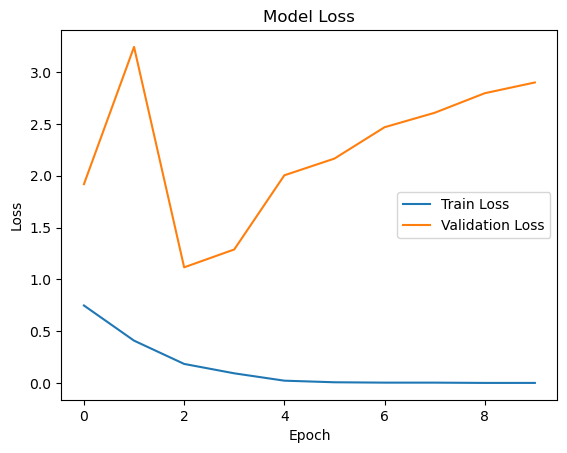

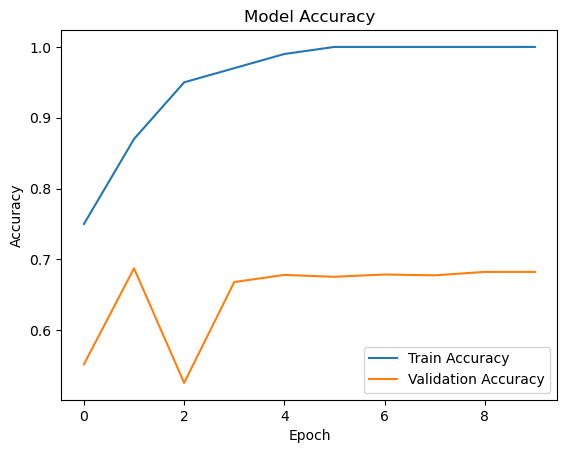

In [132]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training & validation accuracy values
plt.plot(history['train_accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [135]:
class VAECls(nn.Module):
    def __init__(self, vae, pretrained=True, output_features=256):
        super(VAECls, self).__init__()
        
        # Use the pretrained encoder if `pretrained=True`, otherwise initialize a new encoder
        if pretrained:
            self.encoder = vae.encoder  # Use the pretrained encoder
        else:
            # Define a new encoder with random initialization (assuming the same architecture as the VAE encoder)
            self.encoder = nn.Sequential(
                nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),  # Example layer
                nn.ReLU(),
                nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),  # Example layer
                nn.ReLU(),
                nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # Example layer
                nn.ReLU(),
                nn.Flatten()  # Flatten the output for the classifier
            ).to(device)  # Move the new encoder to the device
        
        # Determine the size of the flattened features
        self._temp_x = torch.randn(3, 64, 64).to(device)  # Replace with the shape of your input images
        with torch.no_grad():
            self._temp_x = self.encoder(self._temp_x).view(-1).shape[0]
        
        # Define a classifier network
        self.classifier = nn.Sequential(
            nn.Linear(self._temp_x, output_features),  # Assuming the flattened features are `self._temp_x` size
            nn.ReLU(),
            nn.Linear(output_features, 1),
            nn.Sigmoid()
        ).to(device)  # Move the classifier to the device

    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)  # Flatten the features
        x = self.classifier(x)
        return x

In [136]:
# Instantiate the model with pretrained encoder
vae_model_pretrained = VAECls(vae, pretrained=True).to(device)

# Instantiate the model with randomly initialized encoder
vae_model_random = VAECls(vae, pretrained=False).to(device)

In [141]:
# History dictionary to store metrics
history = {
    'train_loss': [],
    'val_loss': [],
    'train_accuracy': [],
    'val_accuracy': []
}

# Training loop
for epoch in range(epochs):
    # Training phase
    vae_model.train()  # Set the model to training mode
    train_loss = 0.0
    train_accuracy = 0.0

    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)

        # Forward pass
        outputs = vae_model(imgs).squeeze()
        loss = criterion(outputs, labels)
        accuracy = calculate_accuracy(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)
        train_accuracy += accuracy * imgs.size(0)

    # Calculate average training loss and accuracy for the epoch
    train_loss /= len(train_loader.dataset)
    train_accuracy /= len(train_loader.dataset)

    # Validation phase
    vae_model.eval()  # Set the model to evaluation mode
    val_loss = 0.0
    val_accuracy = 0.0

    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = vae_model(imgs).squeeze()
            loss = criterion(outputs, labels)
            accuracy = calculate_accuracy(outputs, labels)

            val_loss += loss.item() * imgs.size(0)
            val_accuracy += accuracy * imgs.size(0)

    # Calculate average validation loss and accuracy for the epoch
    val_loss /= len(val_loader.dataset)
    val_accuracy /= len(val_loader.dataset)

    # Store metrics in history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_accuracy'].append(train_accuracy)
    history['val_accuracy'].append(val_accuracy)

    # Print metrics for the epoch
    print(f'Epoch [{epoch+1}/{epochs}], '
          f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, '
          f'Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')

Epoch [1/10], Train Loss: 1.2252, Train Accuracy: 0.9600, Val Loss: 12.7798, Val Accuracy: 0.6330
Epoch [2/10], Train Loss: 1.3116, Train Accuracy: 0.9400, Val Loss: 11.1174, Val Accuracy: 0.7068
Epoch [3/10], Train Loss: 0.5347, Train Accuracy: 0.9200, Val Loss: 7.5387, Val Accuracy: 0.5722
Epoch [4/10], Train Loss: 2.5313, Train Accuracy: 0.9200, Val Loss: 13.0840, Val Accuracy: 0.5672
Epoch [5/10], Train Loss: 1.6774, Train Accuracy: 0.9000, Val Loss: 9.3252, Val Accuracy: 0.6032
Epoch [6/10], Train Loss: 0.0865, Train Accuracy: 0.9600, Val Loss: 1.9306, Val Accuracy: 0.6146
Epoch [7/10], Train Loss: 0.1285, Train Accuracy: 0.9400, Val Loss: 1.9287, Val Accuracy: 0.6111
Epoch [8/10], Train Loss: 0.0612, Train Accuracy: 0.9700, Val Loss: 3.5971, Val Accuracy: 0.6679
Epoch [9/10], Train Loss: 0.0778, Train Accuracy: 0.9900, Val Loss: 3.2554, Val Accuracy: 0.6578
Epoch [10/10], Train Loss: 0.0040, Train Accuracy: 1.0000, Val Loss: 3.2147, Val Accuracy: 0.6606


In [137]:
# Train the pretrained model
for epoch in range(epochs):
    train_loss, train_accuracy = train_model(vae_model_pretrained, train_loader, criterion, optimizer, device)
    val_loss, val_accuracy = validate_model(vae_model_pretrained, val_loader, criterion, device)
    print(f'Pretrained Model - Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')

# Train the randomly initialized model
for epoch in range(epochs):
    train_loss, train_accuracy = train_model(vae_model_random, train_loader, criterion, optimizer, device)
    val_loss, val_accuracy = validate_model(vae_model_random, val_loader, criterion, device)
    print(f'Random Model - Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')

Pretrained Model - Epoch [1/10], Train Loss: 0.7433, Val Loss: 0.6471
Pretrained Model - Epoch [2/10], Train Loss: 0.5931, Val Loss: 0.6013
Pretrained Model - Epoch [3/10], Train Loss: 0.4903, Val Loss: 0.5940
Pretrained Model - Epoch [4/10], Train Loss: 0.4219, Val Loss: 0.6097
Pretrained Model - Epoch [5/10], Train Loss: 0.3762, Val Loss: 0.5909
Pretrained Model - Epoch [6/10], Train Loss: 0.2838, Val Loss: 0.6084
Pretrained Model - Epoch [7/10], Train Loss: 0.2542, Val Loss: 0.6668
Pretrained Model - Epoch [8/10], Train Loss: 0.1878, Val Loss: 0.7328
Pretrained Model - Epoch [9/10], Train Loss: 0.1700, Val Loss: 0.7895
Pretrained Model - Epoch [10/10], Train Loss: 0.1556, Val Loss: 0.8042
Random Model - Epoch [1/10], Train Loss: 0.9120, Val Loss: 1.0931
Random Model - Epoch [2/10], Train Loss: 0.9120, Val Loss: 1.0931
Random Model - Epoch [3/10], Train Loss: 0.9120, Val Loss: 1.0931
Random Model - Epoch [4/10], Train Loss: 0.9120, Val Loss: 1.0931
Random Model - Epoch [5/10], Train 

Epoch [1/10], Train Loss: 0.0043, Train Accuracy: 1.0000, Val Loss: 2.7741, Val Accuracy: 0.6520
Epoch [2/10], Train Loss: 0.0054, Train Accuracy: 1.0000, Val Loss: 3.2794, Val Accuracy: 0.6590
Epoch [3/10], Train Loss: 0.0012, Train Accuracy: 1.0000, Val Loss: 3.9903, Val Accuracy: 0.6616
Epoch [4/10], Train Loss: 0.0006, Train Accuracy: 1.0000, Val Loss: 4.2416, Val Accuracy: 0.6641
Epoch [5/10], Train Loss: 0.0008, Train Accuracy: 1.0000, Val Loss: 4.3076, Val Accuracy: 0.6638
Epoch [6/10], Train Loss: 0.0005, Train Accuracy: 1.0000, Val Loss: 4.2991, Val Accuracy: 0.6639
Epoch [7/10], Train Loss: 0.0005, Train Accuracy: 1.0000, Val Loss: 4.2386, Val Accuracy: 0.6623
Epoch [8/10], Train Loss: 0.0017, Train Accuracy: 1.0000, Val Loss: 4.1355, Val Accuracy: 0.6619
Epoch [9/10], Train Loss: 0.0003, Train Accuracy: 1.0000, Val Loss: 4.1986, Val Accuracy: 0.6622
Epoch [10/10], Train Loss: 0.0003, Train Accuracy: 1.0000, Val Loss: 4.2870, Val Accuracy: 0.6600


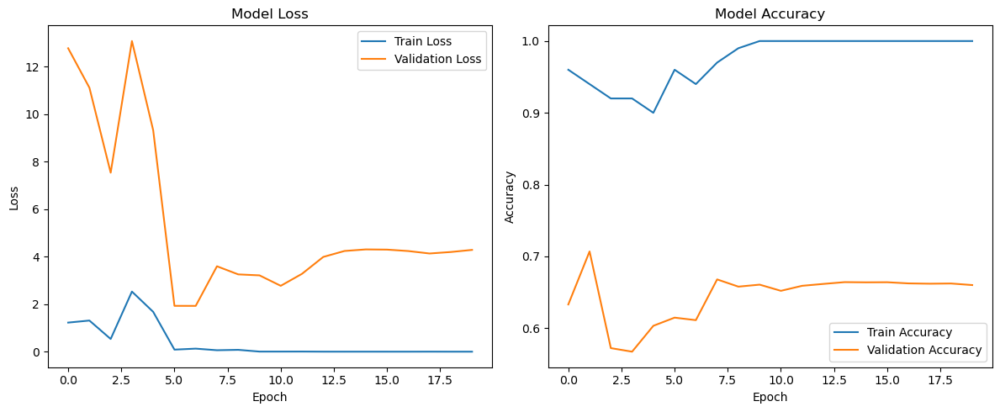

In [142]:
# Train the model
for epoch in range(epochs):
    # Training phase
    vae_model.train()
    train_loss = 0.0
    train_accuracy = 0.0

    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        outputs = vae_model(imgs).squeeze()
        loss = criterion(outputs, labels)
        accuracy = calculate_accuracy(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)
        train_accuracy += accuracy * imgs.size(0)

    train_loss /= len(train_loader.dataset)
    train_accuracy /= len(train_loader.dataset)

    # Validation phase
    vae_model.eval()
    val_loss = 0.0
    val_accuracy = 0.0

    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = vae_model(imgs).squeeze()
            loss = criterion(outputs, labels)
            accuracy = calculate_accuracy(outputs, labels)

            val_loss += loss.item() * imgs.size(0)
            val_accuracy += accuracy * imgs.size(0)

    val_loss /= len(val_loader.dataset)
    val_accuracy /= len(val_loader.dataset)

    # Store metrics
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['train_accuracy'].append(train_accuracy)
    history['val_accuracy'].append(val_accuracy)

    # Print metrics
    print(f'Epoch [{epoch+1}/{epochs}], '
          f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, '
          f'Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')

# Plot the metrics
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Plot loss
plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(history['train_accuracy'], label='Train Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

Training pretrained model...
Epoch [1/10], Train Loss: 3.0699, Train Accuracy: 0.7200, Val Loss: 4.0315, Val Accuracy: 0.6895
Epoch [2/10], Train Loss: 1.3966, Train Accuracy: 0.8900, Val Loss: 1.6684, Val Accuracy: 0.5811
Epoch [3/10], Train Loss: 0.1874, Train Accuracy: 0.9500, Val Loss: 1.2158, Val Accuracy: 0.6394
Epoch [4/10], Train Loss: 0.0610, Train Accuracy: 0.9600, Val Loss: 1.2449, Val Accuracy: 0.6502
Epoch [5/10], Train Loss: 0.0283, Train Accuracy: 0.9900, Val Loss: 1.6304, Val Accuracy: 0.6826
Epoch [6/10], Train Loss: 0.0051, Train Accuracy: 1.0000, Val Loss: 2.0830, Val Accuracy: 0.6943
Epoch [7/10], Train Loss: 0.0824, Train Accuracy: 0.9900, Val Loss: 2.1189, Val Accuracy: 0.6899
Epoch [8/10], Train Loss: 0.0076, Train Accuracy: 1.0000, Val Loss: 1.9576, Val Accuracy: 0.6647
Epoch [9/10], Train Loss: 0.0068, Train Accuracy: 1.0000, Val Loss: 1.8953, Val Accuracy: 0.6930
Epoch [10/10], Train Loss: 0.0033, Train Accuracy: 1.0000, Val Loss: 1.8841, Val Accuracy: 0.6930


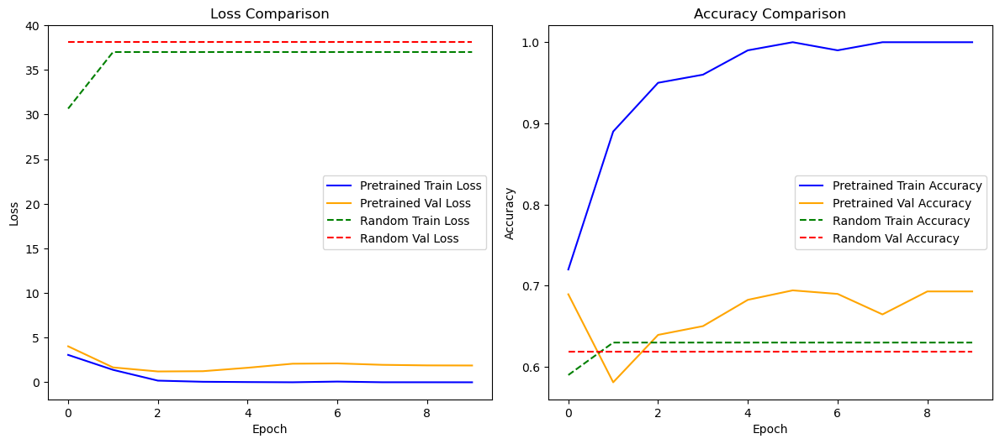

In [143]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt

# Function to calculate accuracy
def calculate_accuracy(outputs, labels):
    predicted = (outputs > 0.5).float()
    correct = (predicted == labels).float().sum()
    accuracy = correct / labels.shape[0]
    return accuracy.item()

# Function to train a model and return its history
def train_model(model, train_loader, val_loader, criterion, optimizer, device, epochs):
    history = {
        'train_loss': [],
        'val_loss': [],
        'train_accuracy': [],
        'val_accuracy': []
    }

    for epoch in range(epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        train_accuracy = 0.0

        for imgs, labels in train_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs).squeeze()
            loss = criterion(outputs, labels)
            accuracy = calculate_accuracy(outputs, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * imgs.size(0)
            train_accuracy += accuracy * imgs.size(0)

        train_loss /= len(train_loader.dataset)
        train_accuracy /= len(train_loader.dataset)

        # Validation phase
        model.eval()
        val_loss = 0.0
        val_accuracy = 0.0

        with torch.no_grad():
            for imgs, labels in val_loader:
                imgs, labels = imgs.to(device), labels.to(device)
                outputs = model(imgs).squeeze()
                loss = criterion(outputs, labels)
                accuracy = calculate_accuracy(outputs, labels)

                val_loss += loss.item() * imgs.size(0)
                val_accuracy += accuracy * imgs.size(0)

        val_loss /= len(val_loader.dataset)
        val_accuracy /= len(val_loader.dataset)

        # Store metrics
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_accuracy'].append(train_accuracy)
        history['val_accuracy'].append(val_accuracy)

        # Print metrics
        print(f'Epoch [{epoch+1}/{epochs}], '
              f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, '
              f'Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')

    return history

# Define the number of epochs
epochs = 10

# Train the pretrained model
print("Training pretrained model...")
vae_model_pretrained = VAECls(vae, pretrained=True).to(device)
optimizer_pretrained = torch.optim.Adam(vae_model_pretrained.parameters(), lr=0.001)
history_pretrained = train_model(vae_model_pretrained, train_loader, val_loader, criterion, optimizer_pretrained, device, epochs)

# Train the randomly initialized model
print("Training randomly initialized model...")
vae_model_random = VAECls(vae, pretrained=False).to(device)
optimizer_random = torch.optim.Adam(vae_model_random.parameters(), lr=0.001)
history_random = train_model(vae_model_random, train_loader, val_loader, criterion, optimizer_random, device, epochs)

# Plot the results
plt.figure(figsize=(12, 10))

# Plot training and validation loss
plt.subplot(2, 2, 1)
plt.plot(history_pretrained['train_loss'], label='Pretrained Train Loss', color='blue')
plt.plot(history_pretrained['val_loss'], label='Pretrained Val Loss', color='orange')
plt.plot(history_random['train_loss'], label='Random Train Loss', color='green', linestyle='--')
plt.plot(history_random['val_loss'], label='Random Val Loss', color='red', linestyle='--')
plt.title('Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(2, 2, 2)
plt.plot(history_pretrained['train_accuracy'], label='Pretrained Train Accuracy', color='blue')
plt.plot(history_pretrained['val_accuracy'], label='Pretrained Val Accuracy', color='orange')
plt.plot(history_random['train_accuracy'], label='Random Train Accuracy', color='green', linestyle='--')
plt.plot(history_random['val_accuracy'], label='Random Val Accuracy', color='red', linestyle='--')
plt.title('Accuracy Comparison')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

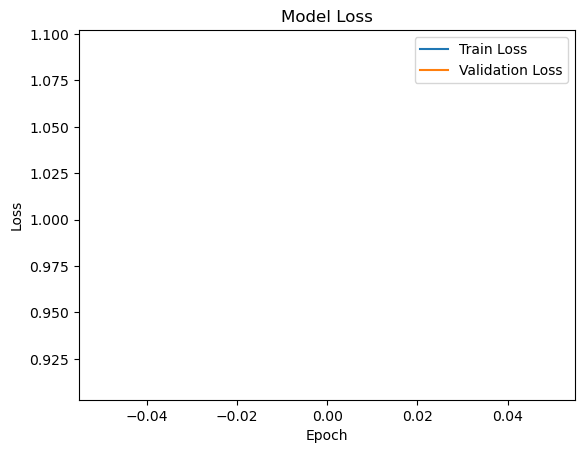

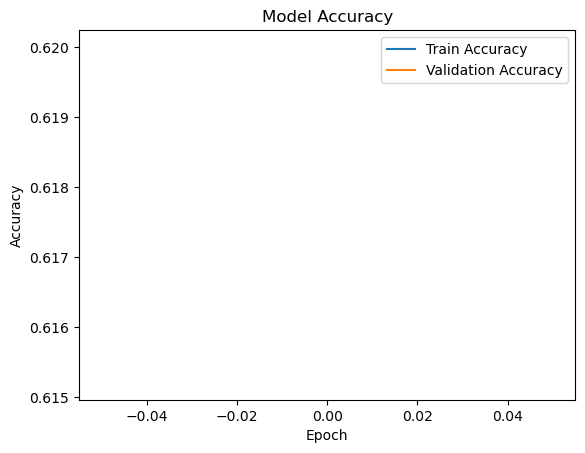

In [139]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training & validation accuracy values
plt.plot(train_accuracy, label='Train Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
#uncomment this line if you want to rebuild the VAE with untrained weights
#autoencoder, ae_encoder, ae_decoder = build_autoencoder(input_shape=(64, 64, 3), dropout=0.3, latent_dim=256)
# vae, var_encoder, var_generator = build_var_autoencoder(latent_dim=256)

# Remove the decoder layers
discriminator = tf.keras.Sequential()
for layer in vae.layers[:-1]:
    discriminator.add(layer)

# Add a new classification layer
discriminator.add(tf.keras.layers.Dense(1, activation='sigmoid'))

# Compile the model
discriminator.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
#make a classification task to predict whether the location is in Scotland or England. Ensure that the classes are balanced (see sense_ae_metadata.csv)
location = np.array([1 if 'leeds' in i else 0 for i in filepaths])

#restrict training to only 100 samples
history = discriminator.fit(x=data[:100], y=location[:100], validation_data=(data[100:], location[100:]), epochs=10)

In [114]:
history.keys()

dict_keys(['train_loss', 'val_loss'])

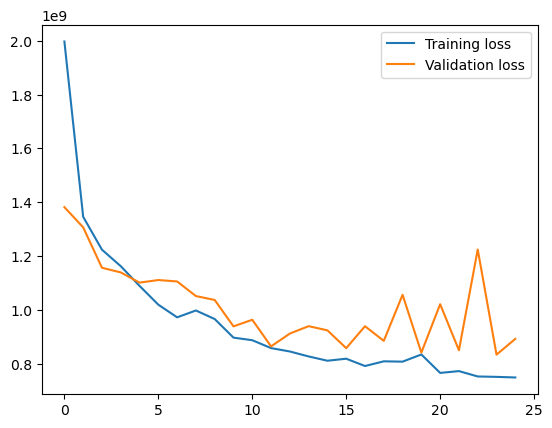

AttributeError: 'dict' object has no attribute 'history'

In [115]:
#what differences do you see when training this model on a downstream task?

plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

plt.plot(history['train_accuracy'], label='Training accuracy')
plt.plot(history['val_accuracy'], label='Validation accuracy')
plt.legend()
plt.show()

<a name="treasurehunt"></a>
# Autoencoder treasure hunt

Clues have been hidden in a Sentinel 2 image. Your job is to find the treasure using an autoencoder - searching through many square kilometres of imagery much faster than if you looked through everything by hand!

Firstly, we read the image in as a cloud-optimised geotiff (COG), and view it:

In [53]:
#install the library to read a COG as an xarray
!pip install rioxarray --quiet

In [54]:
cog_url  = ('https://homepages.see.leeds.ac.uk/~eesjb/sense_training_march24/'
            'leeds_cog.tif')

import rioxarray
rds = rioxarray.open_rasterio(cog_url)
rds

<xarray.DataArray (band: 3, y: 5000, x: 3928)> Size: 471MB
[58920000 values with dtype=float64]
Coordinates:
  * band         (band) int64 24B 1 2 3
  * x            (x) float64 31kB 5.705e+05 5.705e+05 ... 6.098e+05 6.098e+05
  * y            (y) float64 40kB 5.987e+06 5.987e+06 ... 5.937e+06 5.937e+06
    spatial_ref  int64 8B 0
Attributes:
    resolution:     10.0
    spec:           RasterSpec(epsg=32630, bounds=(499980.0, 5890200.0, 60978...
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      stackstac-a59c0526e158aaff38198e5e514e7988

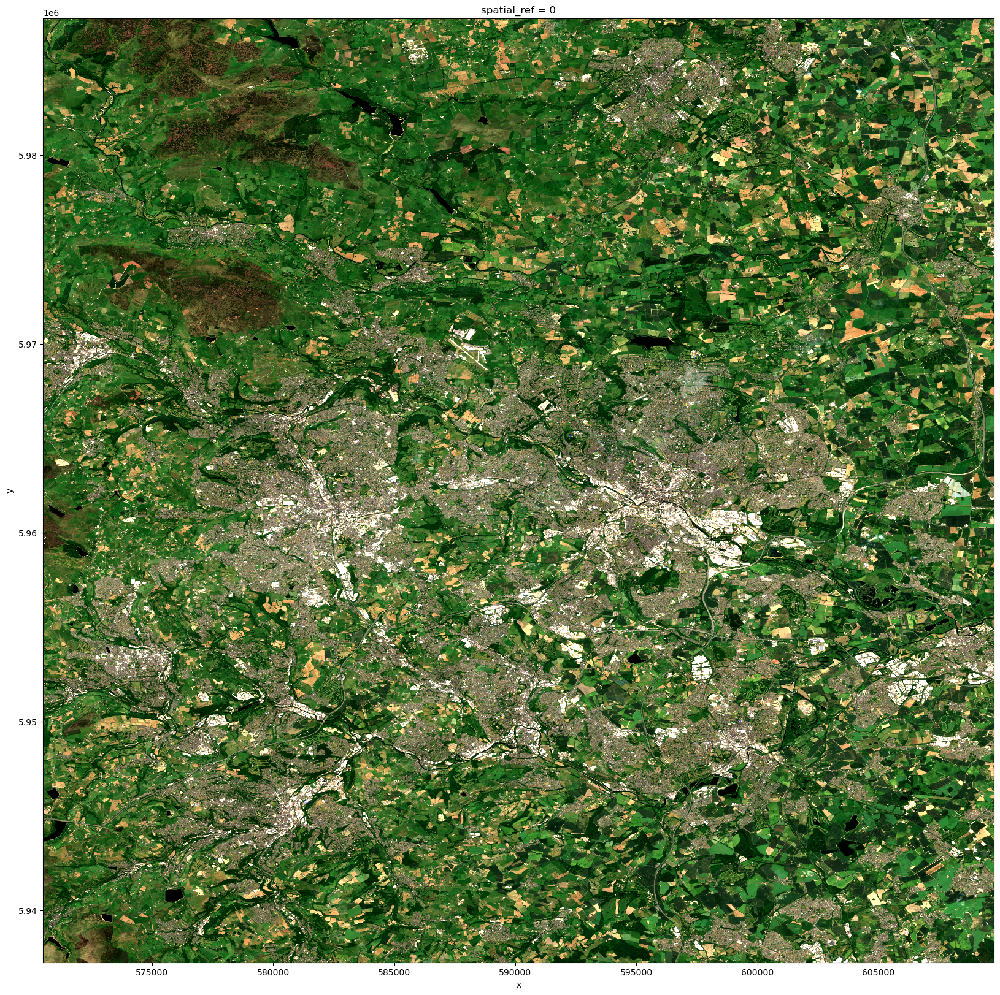

In [55]:
rds.plot.imshow(robust=True, figsize=(20,20))

In [56]:
#cut out a 64x64 pixel window from the cog in sliding window fashion
import rasterio
from rasterio.windows import Window

imgs = []
brightness = 5

# Open the COG
with rasterio.open(cog_url) as src:
    # Loop through the windows
    for i in tqdm(range(5000//32)):
        for j in range(5000//32):
            window = Window(i*64, j*64, 64, 64)
            subset = src.read(window=window)
            # if subset.shape[1] == 64 and subset.shape[2] == 64:
            #     plt.imshow(subset.transpose(1,2,0)*brightness)
            #     plt.show()

            img = subset.transpose(1,2,0)
            if img.shape == (64,64,3):
                imgs.append(img)

imgs = np.array(imgs)

100%|██████████| 156/156 [00:20<00:00,  7.63it/s]


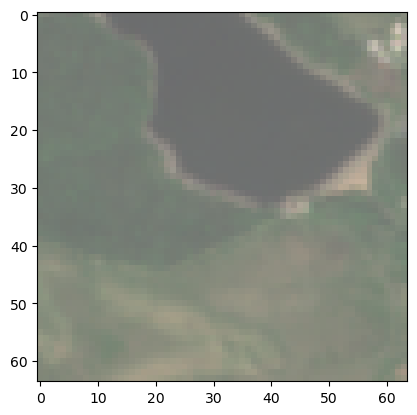

In [122]:
plt.imshow((imgs[200]+0.3)*2)

[6417.2866 6408.5244 7141.8467 ... 5969.232  5789.203  5928.8154]


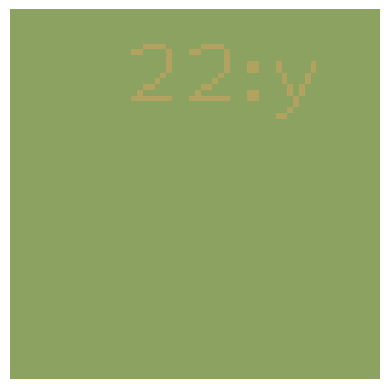

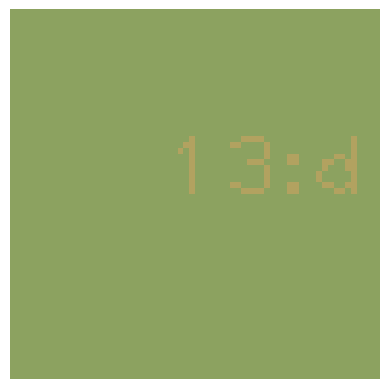

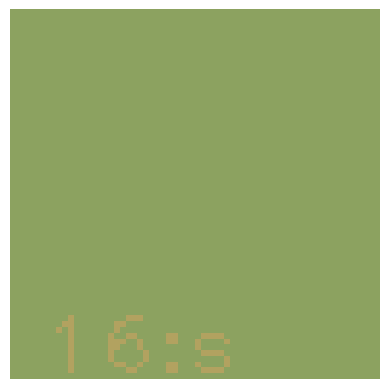

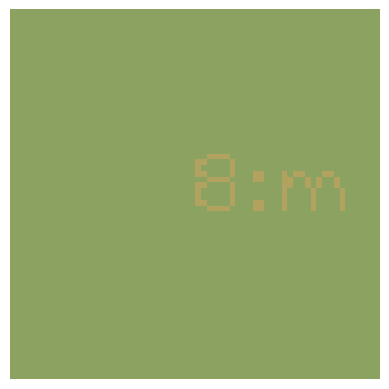

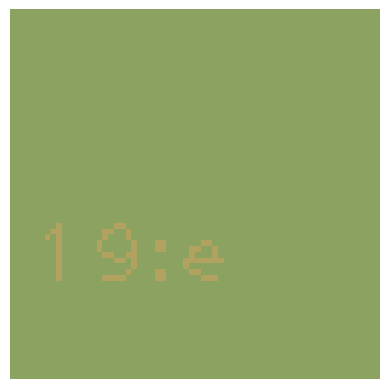

...

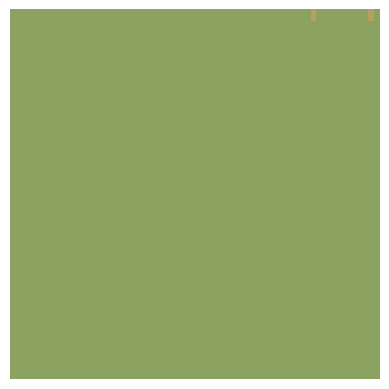

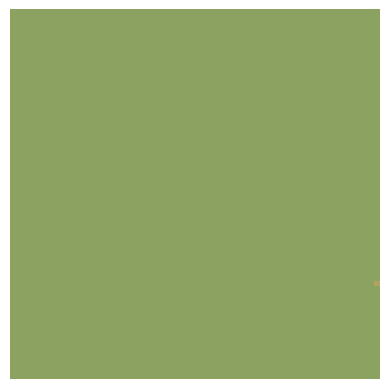

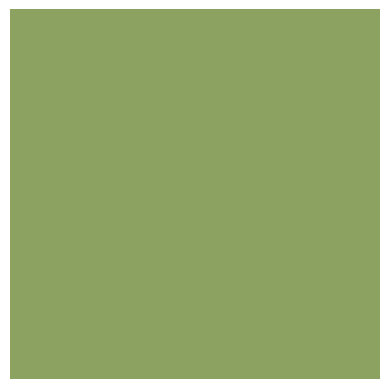

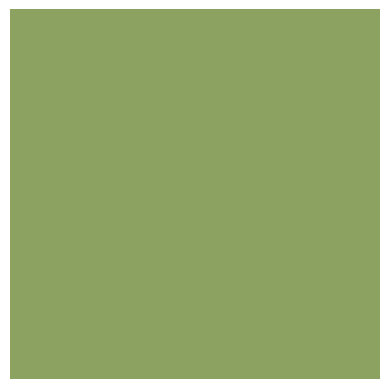

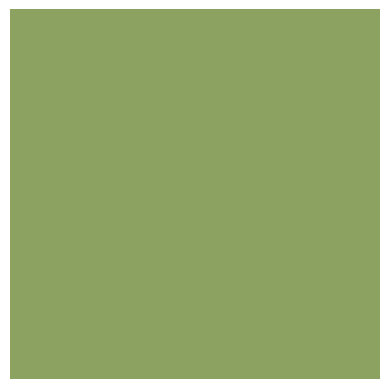

In [140]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Change to tensor
imgs_tensor = torch.tensor(imgs, dtype=torch.float32).to(device).permute(0, 3, 1, 2)  # Change data to (N, C, H, W) format

# Normalizing images
normalised_imgs = (imgs-data_mean)/data_std
normalised_imgs_tensor = torch.tensor(normalised_imgs, dtype=torch.float32).to(device).permute(0, 3, 1, 2) # Change data to (N, C, H, W) format


# Get predictions from the VAE (assuming vae is your model name)
vae.eval()
with torch.no_grad():
    preds, _, _ = vae(normalised_imgs_tensor)  # Change based on your model's output
    preds = preds.squeeze()  # Adjust shape if necessary based on output

        # predicted_img, _, _ = vae(val_tensor[i].unsqueeze(0).to(device))


# Calculate image-wise mean squared reconstruction error
recon_err = torch.mean((normalised_imgs_tensor - preds) ** 2, dim=[1, 2, 3]).cpu().numpy()

# Detecting anomalies
N = 35
anomalies = np.argsort(recon_err)[::-1][:N]
print(recon_err)

# Visualizing anomalies
# fig, ax = plt.subplots(1, N, figsize=(N, 5))
for i in range(N):
    anomaly_image = imgs_tensor[anomalies[i]].cpu().numpy().transpose(2, 1, 0)  # CHW to HWC
    unnormalise = anomaly_image * data_std + data_mean # Adjust this depending on your normalization
    # unnormalise = anomaly_image * data_std.reshape(3,1,1) + data_mean.reshape(3,1,1) # Adjust this depending on your normalization
    # unnormalise = unnormalise(anomaly_image)
    plt.imshow(np.clip(unnormalise*brightness*2, 0, 1))  # Clipping values to valid range for imshow
    plt.axis('off')
    plt.show()

    # ax[i].imshow(np.clip(unnormalise, 0, 1))  # Clipping values to valid range for imshow
    # ax[i].axis('off')
# plt.show()


<a name="stretchgoals"></a>
# Pushing autoencoders further

1. Change the training data to explore new uses for the autoencoder
- create a summer to winter image converter. See [**download script here**](https://github.com/sciml-leeds/SENSE_training/blob/main/download_ae_data.ipynb).
- create an image denoiser

2. Use the VAE as a GCM
- [(inspired by this work)](https://brohan.org/ML_GCM/)
- train VAE on weather data where x is atmosphere at $t$, and y is atmosphere at $t+6$ hours
- run the VAE predictor repeatedly to produce a GCM forecast model
- [**See example notebook here**](https://github.com/sciml-leeds/SENSE_training/blob/main/download_autoencode_gcm_data.ipynb)

3. Detect natural anomalies using the VAE
- see papers eg [eg. detecting avalanches](https://hal.science/hal-02318407/document).

4. Use the VAE for further semi-supervised learning experiments
- initialise the VAE without training
- use the VAE decoder and using $x$ as your image patches and $y$ as your class labels, train a model to discriminate between leeds and edinburgh patches (store the results)
- initialise the VAE again, and train the autoencoder where $x$=$y$. Then take the VAE decoder only and train again to fine-tune to discriminate between leeds and edinburgh patches. What's the difference in the accuracy?

5. Explore the latent space in new ways
- define a starting patch, and a target patch. Find the real images that are the stepping stones on a path in the latent space from the start to the target patch. Plot your results to see the journey from 'car park' to 'beach' eg. [tile2vec latent space exploration](https://ermongroup.github.io/blog/public/img/blog/tile2vec/latent.png).

